In [1]:
import numpy as np
import pandas as pd
import yfinance as yf
import pyfolio as pf

# Download historical data using yfinance
ticker = '^NSEI'  # Example: NSE Index (replace with your preferred ticker)
data = yf.download(ticker, start='2019-01-01', end='2024-12-31')

# Parameters
length = 20
mult = 2.0
stop_loss_perc = 1 / 100
initial_portfolio_value = 1000000  # Starting portfolio value (1,000,000)

# Bollinger Bands Calculation
data['basis'] = data['Close'].rolling(window=length).mean()
data['stddev'] = data['Close'].rolling(window=length).std()
data['upper_band'] = data['basis'] + (mult * data['stddev'])
data['lower_band'] = data['basis'] - (mult * data['stddev'])



C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\pos.py:25: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  warnings.warn(
[*********************100%***********************]  1 of 1 completed


In [2]:
# Initialize trade variables
trade_in_progress_long = 0
trade_in_progress_short = 0
entry_price_long = np.nan
entry_price_short = np.nan
stop_loss_long = np.nan
stop_loss_short = np.nan
portfolio_value = initial_portfolio_value
all_trades = []  # Store all trades
portfolio_values = []  # To store portfolio value after each trade
dates = []  # To store corresponding dates

# Simulate the strategy
for i in range(length, len(data)):
    close_price = data['Close'].iloc[i]
    open_price = data['Open'].iloc[i]
    High = data['High'].iloc[i]
    Low = data['Low'].iloc[i]
    upper_band = data['upper_band'].iloc[i]
    lower_band = data['lower_band'].iloc[i]
    middle_band = data['basis'].iloc[i]

    daily_return = 0  # Reset daily return

    # Long Entry Condition
    if data['Low'].iloc[i] <= data['lower_band'].iloc[i] and trade_in_progress_long == 0:
        entry_price_long = data['lower_band'].iloc[i]
        stop_loss_long = entry_price_long * (1 - stop_loss_perc)
        trade_in_progress_long = 2
        portfolio_value -= entry_price_long  # Update portfolio on entry

    # Long Partial Exit at Middle Bollinger Band
    elif data['High'].iloc[i] >= data['basis'].iloc[i] and trade_in_progress_long == 2:
        portfolio_value += (entry_price_long * 0.5)  # Add 50% of the entry price back to portfolio
        trade_in_progress_long = 1

    # Long Final Exit at Upper Bollinger Band
    elif trade_in_progress_long > 0 and data['High'].iloc[i] >= data['upper_band'].iloc[i]:
        portfolio_value += (entry_price_long * 0.5)  # Add remaining position to portfolio
        trade_in_progress_long = 0

    # Long Stop Loss Enforcement
    elif trade_in_progress_long > 0 and data['Low'].iloc[i] <= stop_loss_long:
        portfolio_value += stop_loss_long  # Update portfolio value on stop loss
        trade_in_progress_long = 0

    # Short Entry Condition
    elif data['High'].iloc[i] >= data['upper_band'].iloc[i] and trade_in_progress_short == 0:
        entry_price_short = data['upper_band'].iloc[i]
        stop_loss_short = entry_price_short * (1 + stop_loss_perc)
        trade_in_progress_short = 2
        portfolio_value += entry_price_short  # Update portfolio on entry

    # Short Partial Exit at Middle Bollinger Band
    elif data['Low'].iloc[i] <= data['basis'].iloc[i] and trade_in_progress_short == 2:
        portfolio_value -= (entry_price_short * 0.5)  # Subtract 50% of the entry price from portfolio
        trade_in_progress_short = 1

    # Short Final Exit at Lower Bollinger Band
    elif trade_in_progress_short > 0 and data['Low'].iloc[i] <= data['lower_band'].iloc[i]:
        portfolio_value -= (entry_price_short * 0.5)  # Subtract remaining position from portfolio
        trade_in_progress_short = 0

    # Short Stop Loss Enforcement
    elif trade_in_progress_short > 0 and data['High'].iloc[i] >= stop_loss_short:
        portfolio_value -= stop_loss_short  # Update portfolio value on stop loss
        trade_in_progress_short = 0

    # Calculate daily return based on the change in portfolio value
    # Update previous portfolio value for the next iteration
    portfolio_values.append(portfolio_value)
    dates.append(data.index[i])
    # Track portfolio value for each day
    portfolio_values.append(portfolio_value)
    dates.append(data.index[i])

# Step 1: Create DataFrame with portfolio values
portfolio_df = pd.DataFrame({
    'date': dates,
    'portfolio_value': portfolio_values
})

# Step 2: Calculate daily returns (percentage change)
portfolio_df['daily_returns'] = portfolio_df['portfolio_value'].pct_change()

# Set 'date' as index
portfolio_df.set_index('date', inplace=True)

# Drop NaN values (if any, from the first day due to pct_change)
portfolio_df.dropna(inplace=True)

# Step 3: Analyze using PyFolio
pf.create_full_tear_sheet(daily_returns)


NameError: name 'daily_returns' is not defined

In [ ]:
import plotly.graph_objects as go

def plot_trades(data, all_trades):
    # Create candlestick chart
    candlestick = go.Candlestick(
        x=data.index,
        open=data['Open'],
        high=data['High'],
        low=data['Low'],
        close=data['Close'],
        name='OHLC',
        increasing_line_color='green', 
        decreasing_line_color='red'
    )

    # Bollinger Bands
    upper_band_trace = go.Scatter(
        x=data.index, 
        y=data['upper_band'], 
        line=dict(color='rgba(255, 0, 0, 0.75)', width=1.5), 
        name='Upper Bollinger Band'
    )

    middle_band_trace = go.Scatter(
        x=data.index, 
        y=data['basis'], 
        line=dict(color='blue', width=1.5), 
        name='Middle Bollinger Band'
    )

    lower_band_trace = go.Scatter(
        x=data.index, 
        y=data['lower_band'], 
        line=dict(color='rgba(0, 255, 0, 0.75)', width=1.5), 
        name='Lower Bollinger Band'
    )

    # Add trade markers for both long and short trades
    trade_markers = []
    for trade in all_trades:
        date, action, price = trade
        
        if 'Long' in action:
            if action == 'Long Entry':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='blue', size=10, symbol='triangle-up'),
                    name='Long Entry'
                ))
            elif action == 'Long 50% Exit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='yellow', size=10, symbol='triangle-up'),
                    name='Long 50% Exit'
                ))
            elif action == 'Long Final Exit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='red', size=10, symbol='triangle-up'),
                    name='Long Final Exit'
                ))
            elif action == 'Long Stop Loss Hit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='green', size=10, symbol='circle'),
                    name='Long Stop Loss Hit'
                ))
                
        elif 'Short' in action:
            if action == 'Short Entry':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='blue', size=10, symbol='triangle-down'),
                    name='Short Entry'
                ))
            elif action == 'Short 50% Exit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='yellow', size=10, symbol='triangle-down'),
                    name='Short 50% Exit'
                ))
            elif action == 'Short Final Exit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='red', size=10, symbol='triangle-down'),
                    name='Short Final Exit'
                ))
            elif action == 'Short Stop Loss Hit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='orange', size=10, symbol='x'),
                    name='Short Stop Loss Hit'
                ))

    # Layout for the chart
    layout = go.Layout(
        title=f"Bollinger Bands and OHLC for {ticker} (Combined Trades)",
        xaxis_title="Date",
        yaxis_title="Price",
        xaxis_rangeslider_visible=False,
        template="plotly_dark"
    )

    # Combine all traces and plot
    fig = go.Figure(data=[candlestick, upper_band_trace, middle_band_trace, lower_band_trace] + trade_markers, layout=layout)
    fig.show()

# Call the function after running your trading strategy
plot_trades(data, all_trades)


In [ ]:
def print_trade_details(all_trades, portfolio_values):
    print(f"{'Date':<15} {'Action':<20} {'Price':<10} {'Portfolio Value':<15}")
    print("-" * 70)  # Updated separator line
    for trade, portfolio_value in zip(all_trades, portfolio_values):
        date, action, price = trade
        print(f"{date.strftime('%Y-%m-%d'):<15} {action:<20} {price:.2f} {portfolio_value:.2f}")
        
print_trade_details(all_trades, portfolio_values)

In [ ]:
portfolio_df.to_csv("daily portfolio value.csv")

[*********************100%***********************]  1 of 1 completed
C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '4.861%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2019-01-31
End date,2024-10-11
Total months,66
,Backtest
Annual return,4.861%
Cumulative returns,30.248%
Annual volatility,8.672%
Sharpe ratio,0.59
Calmar ratio,1.03
Stability,0.77
Max drawdown,-4.714%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,4.71,2021-06-17,2022-06-14,2022-07-21,286
1,4.38,2024-04-12,2024-05-13,2024-05-23,30
2,4.34,2024-02-07,2024-03-20,2024-04-09,45
3,4.25,2024-01-09,2024-01-24,2024-02-02,19
4,3.87,2023-09-21,2023-10-25,2023-11-16,41


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning:

Passed returns do not overlap with anyinteresting times.



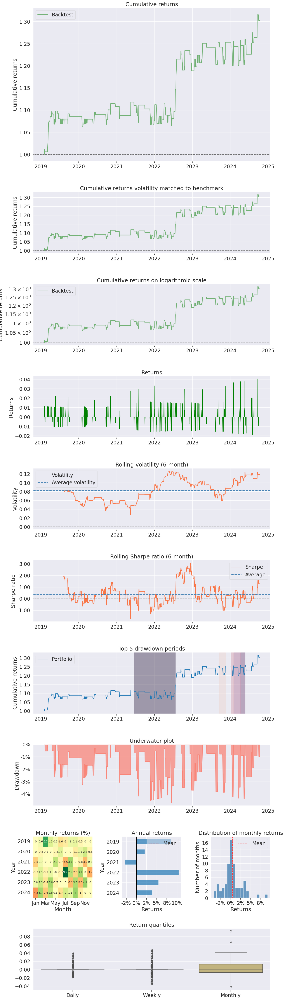

In [7]:
import pandas as pd
import numpy as np
import yfinance as yf
import pyfolio as pf
import matplotlib.pyplot as plt

# Download historical data using yfinance
ticker = '^NSEI'  # Example: NSE Index (replace with your preferred ticker)
data = yf.download(ticker, start='2019-01-01', end='2024-12-31')

# Parameters
length = 20
mult = 2.0
stop_loss_perc = 1 / 100
initial_portfolio_value = 1000000  # Starting portfolio value (1,000,000)

# Bollinger Bands Calculation
data['basis'] = data['Close'].rolling(window=length).mean()
data['stddev'] = data['Close'].rolling(window=length).std()
data['upper_band'] = data['basis'] + (mult * data['stddev'])
data['lower_band'] = data['basis'] - (mult * data['stddev'])

# Initialize trade variables
trade_in_progress = 0  # 0: No trade, 1: Long trade, 2: Short trade
entry_price = np.nan
stop_loss = np.nan
portfolio_value = initial_portfolio_value
all_trades = []  # Store all trades
portfolio_values = []  # To store portfolio value after each trade
dates = []  # To store corresponding dates

# Track partial exits
partial_exit_done = False

# Simulate the strategy
for i in range(length, len(data)):
    close_price = data['Close'].iloc[i]
    high_price = data['High'].iloc[i]
    low_price = data['Low'].iloc[i]
    upper_band = data['upper_band'].iloc[i]
    lower_band = data['lower_band'].iloc[i]
    middle_band = data['basis'].iloc[i]

    # Handle existing short trades
    if trade_in_progress == 3:  # Short trade in progress
        # Stop loss enforcement
        if high_price >= stop_loss:
            all_trades.append((data.index[i], 'Short Stop Loss Hit', stop_loss))
            portfolio_value += stop_loss  # Update portfolio value on stop loss
            trade_in_progress = 0  # Reset trade in progress
            entry_price = np.nan
            stop_loss = np.nan
            partial_exit_done = False  # Reset partial exit flag
        # Final exit at lower Bollinger Band
        elif low_price <= lower_band:
            all_trades.append((data.index[i], 'Short Final Exit', lower_band))
            portfolio_value -= lower_band  # Close position
            trade_in_progress = 0  # Reset trade in progress
            entry_price = np.nan
            stop_loss = np.nan
            partial_exit_done = False  # Reset partial exit flag
        # Partial exit at middle Bollinger Band
        elif not partial_exit_done and high_price >= middle_band and low_price <= middle_band:
            all_trades.append((data.index[i], 'Short 50% Exit', middle_band))
            stop_loss = entry_price  # Move stop loss to breakeven
            portfolio_value -= middle_band * 0.5  # Add 50% of the position to portfolio value
            partial_exit_done = True  # Mark partial exit as done

    # Handle existing long trades
    elif trade_in_progress == 2:  # Long trade in progress
        # Stop loss enforcement
        if low_price <= stop_loss:
            all_trades.append((data.index[i], 'Long Stop Loss Hit', stop_loss))
            portfolio_value += stop_loss  # Update portfolio value on stop loss
            trade_in_progress = 0  # Reset trade in progress
            entry_price = np.nan
            stop_loss = np.nan
            partial_exit_done = False  # Reset partial exit flag
        # Final exit at upper Bollinger Band
        elif high_price >= upper_band:
            all_trades.append((data.index[i], 'Long Final Exit', upper_band))
            portfolio_value += upper_band  # Close position
            trade_in_progress = 0  # Reset trade in progress
            entry_price = np.nan
            stop_loss = np.nan
            partial_exit_done = False  # Reset partial exit flag
            
            # Immediately short 2 stocks
            entry_price_short = upper_band
            stop_loss_short = entry_price_short * (1 + stop_loss_perc)  # Set stop loss above entry
            trade_in_progress = 3  # Short trade
            all_trades.append((data.index[i], 'Short Entry', entry_price_short))
            portfolio_value += entry_price_short  # Update portfolio on entry for short
            partial_exit_done = False  # Reset partial exit flag for new trade
        # Partial exit at middle Bollinger Band
        elif not partial_exit_done and low_price >= middle_band and high_price <= upper_band:
            all_trades.append((data.index[i], 'Long 50% Exit', middle_band))
            portfolio_value += middle_band * 0.5  # Add 50% of the position to portfolio value
            stop_loss = entry_price  # Move stop loss to breakeven
            partial_exit_done = True  # Mark partial exit as done

    # Short Entry Condition
    elif low_price <= upper_band and high_price >= upper_band and trade_in_progress == 0:
        entry_price = upper_band
        stop_loss = entry_price * (1 + stop_loss_perc)  # Set stop loss above entry
        trade_in_progress = 3  # Short trade
        all_trades.append((data.index[i], 'Short Entry', upper_band))
        portfolio_value += entry_price  # Update portfolio on entry
        partial_exit_done = False  # Reset partial exit flag for new trade

    # Long Entry Condition
    elif low_price <= lower_band and high_price >= lower_band and trade_in_progress == 0:
        entry_price = lower_band
        stop_loss = entry_price * (1 - stop_loss_perc)  # Set stop loss below entry
        trade_in_progress = 2  # Long trade
        all_trades.append((data.index[i], 'Long Entry', lower_band))
        portfolio_value -= entry_price  # Update portfolio on entry
        partial_exit_done = False  # Reset partial exit flag for new trade

    
    # Track portfolio value for each day
    portfolio_values.append(portfolio_value)
    dates.append(data.index[i])

# Step 1: Create DataFrame with portfolio values
portfolio_df = pd.DataFrame({
    'date': dates,
    'portfolio_value': portfolio_values
})

# Step 2: Calculate daily returns (percentage change)
portfolio_df['daily_returns'] = portfolio_df['portfolio_value'].pct_change()

# Set 'date' as index
portfolio_df.set_index('date', inplace=True)

# Drop NaN values (if any, from the first day due to pct_change)
portfolio_df.dropna(inplace=True)

# Step 3: Analyze using PyFolio
pf.create_full_tear_sheet(portfolio_df['daily_returns'])


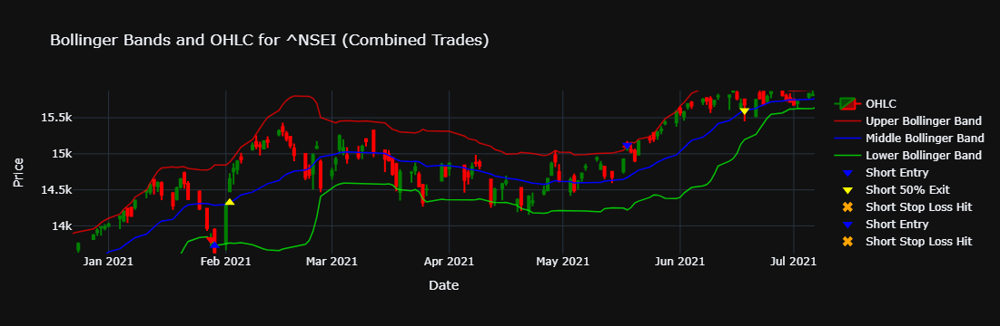

In [8]:
import plotly.graph_objects as go

def plot_trades(data, all_trades):
    # Create candlestick chart
    candlestick = go.Candlestick(
        x=data.index,
        open=data['Open'],
        high=data['High'],
        low=data['Low'],
        close=data['Close'],
        name='OHLC',
        increasing_line_color='green', 
        decreasing_line_color='red'
    )

    # Bollinger Bands
    upper_band_trace = go.Scatter(
        x=data.index, 
        y=data['upper_band'], 
        line=dict(color='rgba(255, 0, 0, 0.75)', width=1.5), 
        name='Upper Bollinger Band'
    )

    middle_band_trace = go.Scatter(
        x=data.index, 
        y=data['basis'], 
        line=dict(color='blue', width=1.5), 
        name='Middle Bollinger Band'
    )

    lower_band_trace = go.Scatter(
        x=data.index, 
        y=data['lower_band'], 
        line=dict(color='rgba(0, 255, 0, 0.75)', width=1.5), 
        name='Lower Bollinger Band'
    )

    # Add trade markers for both long and short trades
    trade_markers = []
    for trade in all_trades:
        date, action, price = trade
        
        if 'Long' in action:
            if action == 'Long Entry':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='blue', size=10, symbol='triangle-up'),
                    name='Long Entry'
                ))
            elif action == 'Long 50% Exit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='yellow', size=10, symbol='triangle-up'),
                    name='Long 50% Exit'
                ))
            elif action == 'Long Final Exit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='red', size=10, symbol='triangle-up'),
                    name='Long Final Exit'
                ))
            elif action == 'Long Stop Loss Hit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='green', size=10, symbol='circle'),
                    name='Long Stop Loss'
                ))
                
        elif 'Short' in action:
            if action == 'Short Entry':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='blue', size=10, symbol='triangle-down'),
                    name='Short Entry'
                ))
            elif action == 'Short 50% Exit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='yellow', size=10, symbol='triangle-down'),
                    name='Short 50% Exit'
                ))
            elif action == 'Short Final Exit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='red', size=10, symbol='triangle-down'),
                    name='Short Final Exit'
                ))
            elif action == 'Short Stop Loss Hit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='orange', size=10, symbol='x'),
                    name='Short Stop Loss Hit'
                ))

    # Layout for the chart
    layout = go.Layout(
        title=f"Bollinger Bands and OHLC for {ticker} (Combined Trades)",
        xaxis_title="Date",
        yaxis_title="Price",
        xaxis_rangeslider_visible=False,
        template="plotly_dark"
    )

    # Combine all traces and plot
    fig = go.Figure(data=[candlestick, upper_band_trace, middle_band_trace, lower_band_trace] + trade_markers, layout=layout)
    fig.show()

# Call the function after running your trading strategy
plot_trades(data, all_trades)


In [ ]:
# Print all trades
print("All Trades:")
for trade in all_trades:
    trade_date, trade_type, trade_price = trade
    print(f"Date: {trade_date}, Trade Type: {trade_type}, Price: {trade_price}")


In [ ]:
def calculate_drawdowns(portfolio_values):
    """
    Calculate drawdowns and maximum drawdown from the portfolio values.

    Parameters:
    - portfolio_values: A list or array of portfolio values over time.

    Returns:
    - drawdowns: A list of drawdown values.
    - max_drawdown: The maximum drawdown value.
    """
    # Convert portfolio values to a numpy array for calculations
    portfolio_values = np.array(portfolio_values)

    # Calculate the running maximum
    running_max = np.maximum.accumulate(portfolio_values)

    # Calculate drawdowns
    drawdowns = (portfolio_values - running_max) / running_max

    # Calculate maximum drawdown
    max_drawdown = drawdowns.min()  # Minimum value in drawdowns is the max drawdown

    return drawdowns, max_drawdown


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\pos.py:25: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  warnings.warn(
[*********************100%***********************]  1 of 1 completed


2019-02-06 - Short Entry at 11059.86, Stocks Held: -2
2019-02-11 - Short 50% Cover at 10871.83, Stocks Held: -1
2019-03-06 - Short Stop Loss Hit at 11059.86
2019-03-11 - Short Entry at 11150.94, Stocks Held: -2
2019-03-12 - Short Stop Loss Hit at 11262.45
2019-03-12 - Short Entry at 11228.37, Stocks Held: -2
2019-03-13 - Short Stop Loss Hit at 11340.65
2019-03-13 - Short Entry at 11308.00, Stocks Held: -2
2019-03-15 - Short Stop Loss Hit at 11421.08
2019-03-15 - Short Entry at 11455.13, Stocks Held: -2
2019-03-22 - Short Stop Loss Hit at 11569.69
2019-04-16 - Short Entry at 11799.37, Stocks Held: -2
2019-04-22 - Short 50% Cover at 11602.32, Stocks Held: -1
2019-05-07 - Short Final Cover at 11504.52
2019-05-07 - Long Entry at 11504.52, Stocks Held: 2
2019-05-08 - Long Stop Loss Hit at 11389.48
2019-05-08 - Long Entry at 11443.68, Stocks Held: 2
2019-05-09 - Long Stop Loss Hit at 11329.24
2019-05-09 - Long Entry at 11373.97, Stocks Held: 2
2019-05-10 - Long Stop Loss Hit at 11260.23
2019

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.594%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  perf_stats.loc[stat, column] = str(np.round(value * 100, 3)) + "%"


Start date,2019-01-31
End date,2024-10-14
Total months,66
,Backtest
Annual return,0.594%
Cumulative returns,3.357%
Annual volatility,18.241%
Sharpe ratio,0.12
Calmar ratio,0.07
Stability,0.01
Max drawdown,-9.14%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,9.14,2024-07-31,2024-08-05,2024-09-19,37
1,8.49,2024-04-12,2024-05-09,2024-05-23,30
2,8.40,2024-02-27,2024-03-19,2024-04-09,31
3,8.20,2024-01-16,2024-01-23,2024-02-02,14
4,7.60,2022-11-29,2023-10-26,2023-12-01,264


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Daily", "Weekly", "Monthly"])
C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning: Passed returns do not overlap with anyinteresting times.
  warnings.warn(


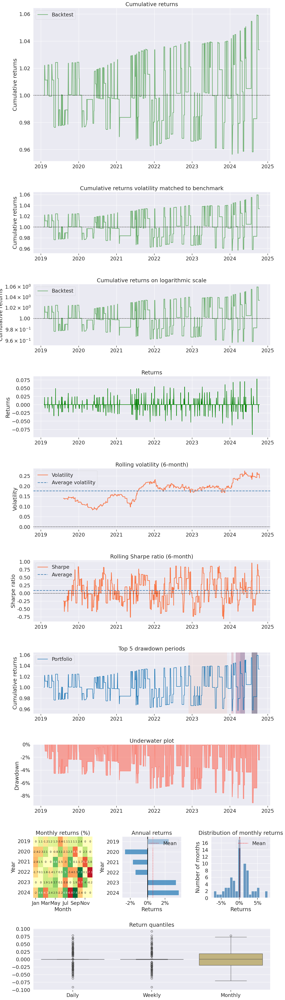

In [1]:
import pandas as pd
import numpy as np
import yfinance as yf
import pyfolio as pf
import matplotlib.pyplot as plt

def calculate_drawdowns(portfolio_values):
    portfolio_values = np.array(portfolio_values)
    running_max = np.maximum.accumulate(portfolio_values)
    drawdowns = (portfolio_values - running_max) / running_max
    max_drawdown = drawdowns.min()
    return drawdowns, max_drawdown

# Download historical data using yfinance
ticker = '^NSEI'  # Replace with your preferred ticker
data = yf.download(ticker, start='2019-01-01', end='2024-12-31')

# Parameters
length = 20
mult = 2.0
initial_portfolio_value = 1000000  # Starting portfolio value

# Bollinger Bands Calculation
data['basis'] = data['Close'].rolling(window=length).mean()
data['stddev'] = data['Close'].rolling(window=length).std()
data['upper_band'] = data['basis'] + (mult * data['stddev'])
data['lower_band'] = data['basis'] - (mult * data['stddev'])

# Initialize variables
trade_in_progress = 0  # 0: No trade, 1: Long, 2: Short
entry_price = np.nan
stop_loss = np.nan
portfolio_value = initial_portfolio_value
all_trades = []  # Record of all trades
portfolio_values = []  # Portfolio value after each day
dates = []  # Dates corresponding to portfolio values
stocks_held = 0  # Number of stocks held (positive for long, negative for short)
partial_exit_done = False  # Track if partial exit has occurred

# Simulate the strategy
for i in range(length, len(data)):
    current_date = data.index[i]
    close_price = data['Close'].iloc[i]
    high_price = data['High'].iloc[i]
    low_price = data['Low'].iloc[i]
    upper_band = data['upper_band'].iloc[i]
    lower_band = data['lower_band'].iloc[i]
    middle_band = data['basis'].iloc[i]

    dates.append(current_date)  # Track date

    # Handle existing long trades
    if trade_in_progress == 1:  # Long position is active
        # Stop loss enforcement
        if low_price <= stop_loss:
            exit_price = stop_loss
            portfolio_value += exit_price * stocks_held  # Close position at stop loss price
            all_trades.append((current_date, 'Long Stop Loss Hit', exit_price))
            print(f"{current_date.date()} - Long Stop Loss Hit at {exit_price:.2f}")
            trade_in_progress = 0
            stocks_held = 0
            partial_exit_done = False
            entry_price = np.nan
            stop_loss = np.nan

       
              # Partial exit at middle Bollinger Band during long trades
        elif not partial_exit_done and low_price <= middle_band <= high_price:
            exit_price = middle_band
            sell_quantity = stocks_held // 2  # Sell 50% of holdings
            portfolio_value += exit_price * sell_quantity
            stocks_held -= sell_quantity
            partial_exit_done = True
            stop_loss = entry_price  # Move stop loss to breakeven
            all_trades.append((current_date, 'Long 50% Exit', exit_price))
            print(f"{current_date.date()} - Long 50% Exit at {exit_price:.2f}, Stocks Held: {stocks_held}")


        # Final exit at upper Bollinger Band
        
        elif high_price >= upper_band:
            exit_price = upper_band
            portfolio_value += exit_price * stocks_held
            all_trades.append((current_date, 'Long Final Exit', exit_price))
            print(f"{current_date.date()} - Long Final Exit at {exit_price:.2f}")
            trade_in_progress = 0
            stocks_held = 0
            partial_exit_done = False
            entry_price = np.nan
            stop_loss = np.nan

    # Handle existing short trades
    elif trade_in_progress == 2:  # Short position is active
        # Stop loss enforcement
        if high_price >= stop_loss:
            exit_price = stop_loss
            portfolio_value -= exit_price * abs(stocks_held)  # Cover at stop loss price
            all_trades.append((current_date, 'Short Stop Loss Hit', exit_price))
            print(f"{current_date.date()} - Short Stop Loss Hit at {exit_price:.2f}")
            trade_in_progress = 0
            stocks_held = 0
            partial_exit_done = False
            entry_price = np.nan
            stop_loss = np.nan

      
        # Partial short cover at middle Bollinger Band during short trades
        elif not partial_exit_done and low_price <= middle_band and high_price >= middle_band:
            exit_price = middle_band
            buy_quantity = abs(stocks_held) // 2  # Cover 50% of short holdings
            portfolio_value -= exit_price * buy_quantity
            stocks_held += buy_quantity
            partial_exit_done = True
            stop_loss = entry_price  # Move stop loss to breakeven
            all_trades.append((current_date, 'Short 50% Cover', exit_price))
            print(f"{current_date.date()} - Short 50% Cover at {exit_price:.2f}, Stocks Held: {stocks_held}")


        # Final cover at lower Bollinger Band
        
        elif low_price <= lower_band:
            exit_price = lower_band
            portfolio_value -= exit_price * abs(stocks_held)
            all_trades.append((current_date, 'Short Final Cover', exit_price))
            print(f"{current_date.date()} - Short Final Cover at {exit_price:.2f}")
            trade_in_progress = 0
            stocks_held = 0
            partial_exit_done = False
            entry_price = np.nan
            stop_loss = np.nan

    # Entry conditions (only if no trade is in progress)
    if trade_in_progress == 0:
        # Long Entry Condition
        if low_price <= lower_band:
            entry_price = lower_band
            stop_loss = entry_price * 0.99  # Stop loss 2% below entry
            trade_in_progress = 1
            stocks_held = 2  # Buy 2 units
            portfolio_value -= entry_price * stocks_held
            partial_exit_done = False
            all_trades.append((current_date, 'Long Entry', entry_price))
            print(f"{current_date.date()} - Long Entry at {entry_price:.2f}, Stocks Held: {stocks_held}")

        # Short Entry Condition
        elif high_price >= upper_band:
            entry_price = upper_band
            stop_loss = entry_price * 1.01 # Stop loss 2% above entry
            trade_in_progress = 2
            stocks_held = -2  # Short 2 units
            portfolio_value += entry_price * abs(stocks_held)
            partial_exit_done = False
            all_trades.append((current_date, 'Short Entry', entry_price))
            print(f"{current_date.date()} - Short Entry at {entry_price:.2f}, Stocks Held: {stocks_held}")

    # Track portfolio value for each day
    portfolio_values.append(portfolio_value)

# Step 1: Create DataFrame with portfolio values
portfolio_df = pd.DataFrame({
    'date': dates,
    'portfolio_value': portfolio_values
})

# Step 2: Calculate daily returns (percentage change)
portfolio_df['daily_returns'] = portfolio_df['portfolio_value'].pct_change()

# Set 'date' as index
portfolio_df.set_index('date', inplace=True)

# Drop NaN values (if any, from the first day due to pct_change)
portfolio_df.dropna(inplace=True)

# Step 3: Calculate drawdowns and max drawdown
drawdowns, max_drawdown = calculate_drawdowns(portfolio_df['portfolio_value'].values)
print("Max Drawdown:", max_drawdown)

# Step 4: Analyze using Pyfolio
pf.create_full_tear_sheet(portfolio_df['daily_returns'])


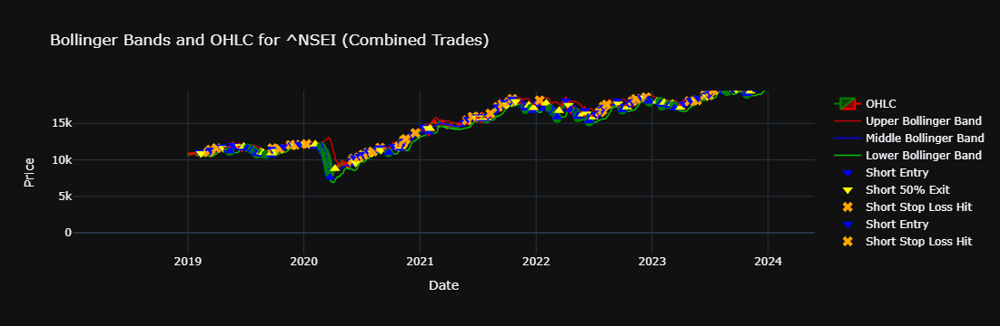

In [37]:
import plotly.graph_objects as go

def plot_trades(data, all_trades):
    # Create candlestick chart
    candlestick = go.Candlestick(
        x=data.index,
        open=data['Open'],
        high=data['High'],
        low=data['Low'],
        close=data['Close'],
        name='OHLC',
        increasing_line_color='green', 
        decreasing_line_color='red'
    )

    # Bollinger Bands
    upper_band_trace = go.Scatter(
        x=data.index, 
        y=data['upper_band'], 
        line=dict(color='rgba(255, 0, 0, 0.75)', width=1.5), 
        name='Upper Bollinger Band'
    )

    middle_band_trace = go.Scatter(
        x=data.index, 
        y=data['basis'], 
        line=dict(color='blue', width=1.5), 
        name='Middle Bollinger Band'
    )

    lower_band_trace = go.Scatter(
        x=data.index, 
        y=data['lower_band'], 
        line=dict(color='rgba(0, 255, 0, 0.75)', width=1.5), 
        name='Lower Bollinger Band'
    )

    # Add trade markers for both long and short trades
    trade_markers = []
    for trade in all_trades:
        date, action, price = trade
        
        if 'Long' in action:
            if action == 'Long Entry':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='blue', size=10, symbol='triangle-up'),
                    name='Long Entry'
                ))
            elif action == 'Long 50% Exit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='yellow', size=10, symbol='triangle-up'),
                    name='Long 50% Exit'
                ))
            elif action == 'Long Final Exit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='red', size=10, symbol='triangle-up'),
                    name='Long Final Exit'
                ))
            elif action == 'Long Stop Loss Hit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='green', size=10, symbol='circle'),
                    name='Long Stop Loss'
                ))
                
        elif 'Short' in action:
            if action == 'Short Entry':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='blue', size=10, symbol='triangle-down'),
                    name='Short Entry'
                ))
            elif action == 'Short 50% Cover':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='yellow', size=10, symbol='triangle-down'),
                    name='Short 50% Exit'
                ))
            elif action == 'Short Final Cover':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='red', size=10, symbol='triangle-down'),
                    name='Short Final Exit'
                ))
            elif action == 'Short Stop Loss Hit':
                trade_markers.append(go.Scatter(
                    x=[date],
                    y=[price],
                    mode='markers',
                    marker=dict(color='orange', size=10, symbol='x'),
                    name='Short Stop Loss Hit'
                ))

    # Layout for the chart
    layout = go.Layout(
        title=f"Bollinger Bands and OHLC for {ticker} (Combined Trades)",
        xaxis_title="Date",
        yaxis_title="Price",
        xaxis_rangeslider_visible=False,
        template="plotly_dark"
    )

    # Combine all traces and plot
    fig = go.Figure(data=[candlestick, upper_band_trace, middle_band_trace, lower_band_trace] + trade_markers, layout=layout)
    fig.show()

# Call the function after running your trading strategy
plot_trades(data, all_trades)


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\pos.py:25: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  warnings.warn(
[*********************100%***********************]  1 of 1 completed


2019-02-06 - Short Entry at 11059.86, Stocks Held: -90.4170
2019-02-11 - Short 50% Cover at 10871.83, Stocks Held: -45.2085
2019-03-06 - Short Stop Loss Hit at 11059.86
2019-03-11 - Short Entry at 11150.94, Stocks Held: -90.0597
2019-03-12 - Short Stop Loss Hit at 11262.45
2019-03-12 - Short Entry at 11228.37, Stocks Held: -88.8360
2019-03-13 - Short Stop Loss Hit at 11340.65
2019-03-13 - Short Entry at 11308.00, Stocks Held: -87.9196
2019-03-15 - Short Stop Loss Hit at 11421.08
2019-03-15 - Short Entry at 11455.13, Stocks Held: -86.3383
2019-03-22 - Short Stop Loss Hit at 11569.69
2019-04-16 - Short Entry at 11799.37, Stocks Held: -83.4219
2019-04-22 - Short 50% Cover at 11602.32, Stocks Held: -41.7109
2019-05-07 - Short Final Cover at 11504.52
2019-05-07 - Long Entry at 11504.52, Stocks Held: 86.4636
2019-05-08 - Long Stop Loss Hit at 11389.48
2019-05-08 - Long Entry at 11443.68, Stocks Held: 86.3632
2019-05-09 - Long Stop Loss Hit at 11329.24
2019-05-09 - Long Entry at 11373.97, Sto

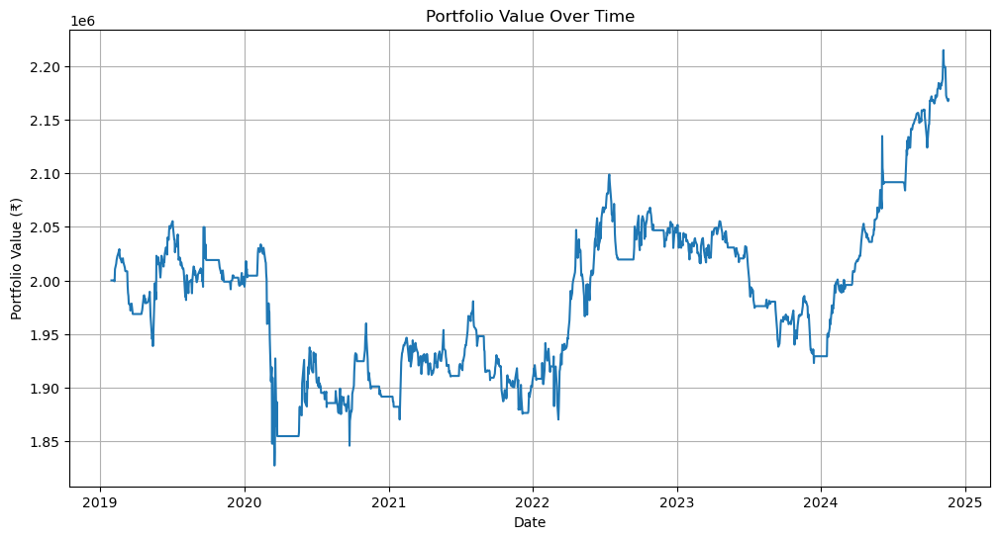

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.438%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  perf_stats.loc[stat, column] = str(np.round(value * 100, 3)) + "%"


Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,1.438%
Cumulative returns,8.442%
Annual volatility,7.043%
Sharpe ratio,0.24
Calmar ratio,0.13
Stability,0.22
Max drawdown,-11.084%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,11.08,2019-07-04,2020-03-18,2022-06-13,768
1,8.37,2022-07-14,2023-12-14,2024-06-04,494
2,4.45,2019-02-19,2019-05-15,2019-06-17,85
3,2.38,2024-06-04,2024-08-01,2024-08-16,54
4,2.15,2024-11-06,2024-11-18,NaT,NaN


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Daily", "Weekly", "Monthly"])
C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning: Passed returns do not overlap with anyinteresting times.
  warnings.warn(
[*********************100%***********************]  1 of 1 completed


2019-02-06 - Short Entry at 11059.86, Stocks Held: -45.2085
2019-02-11 - Short 50% Cover at 10871.83, Stocks Held: -22.6043
2019-03-06 - Short Stop Loss Hit at 11059.86
2019-03-11 - Short Entry at 11150.94, Stocks Held: -45.0299
2019-03-12 - Short Stop Loss Hit at 11262.45
2019-03-12 - Short Entry at 11228.37, Stocks Held: -44.4180
2019-03-13 - Short Stop Loss Hit at 11340.65
2019-03-13 - Short Entry at 11308.00, Stocks Held: -43.9598
2019-03-15 - Short Stop Loss Hit at 11421.08
2019-03-15 - Short Entry at 11455.13, Stocks Held: -43.1692
2019-03-22 - Short Stop Loss Hit at 11569.69
2019-04-16 - Short Entry at 11799.37, Stocks Held: -41.7109
2019-04-22 - Short 50% Cover at 11602.32, Stocks Held: -20.8555
2019-05-07 - Short Final Cover at 11504.52
2019-05-07 - Long Entry at 11504.52, Stocks Held: 43.2318
2019-05-08 - Long Stop Loss Hit at 11389.48
2019-05-08 - Long Entry at 11443.68, Stocks Held: 43.1816
2019-05-09 - Long Stop Loss Hit at 11329.24
2019-05-09 - Long Entry at 11373.97, Sto

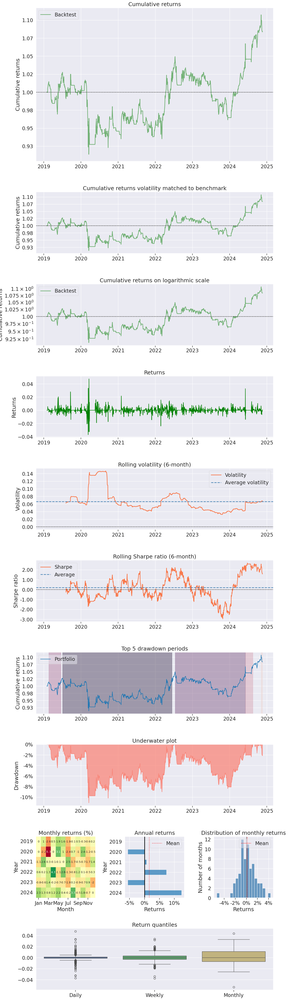

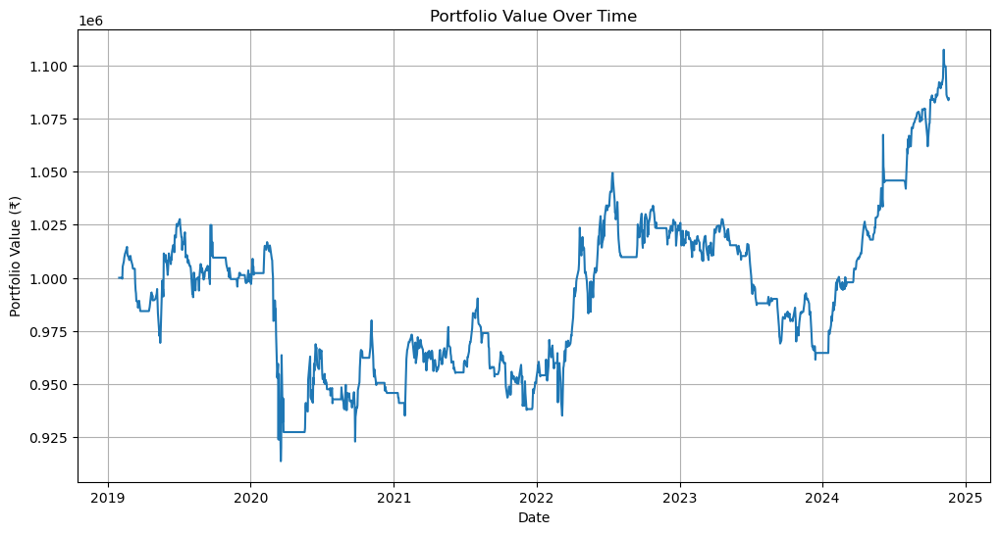

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.438%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  perf_stats.loc[stat, column] = str(np.round(value * 100, 3)) + "%"


Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,1.438%
Cumulative returns,8.442%
Annual volatility,7.043%
Sharpe ratio,0.24
Calmar ratio,0.13
Stability,0.22
Max drawdown,-11.084%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,11.08,2019-07-04,2020-03-18,2022-06-13,768
1,8.37,2022-07-14,2023-12-14,2024-06-04,494
2,4.45,2019-02-19,2019-05-15,2019-06-17,85
3,2.38,2024-06-04,2024-08-01,2024-08-16,54
4,2.15,2024-11-06,2024-11-18,NaT,NaN


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(["Daily", "Weekly", "Monthly"])
C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning: Passed returns do not overlap with anyinteresting times.
  warnings.warn(


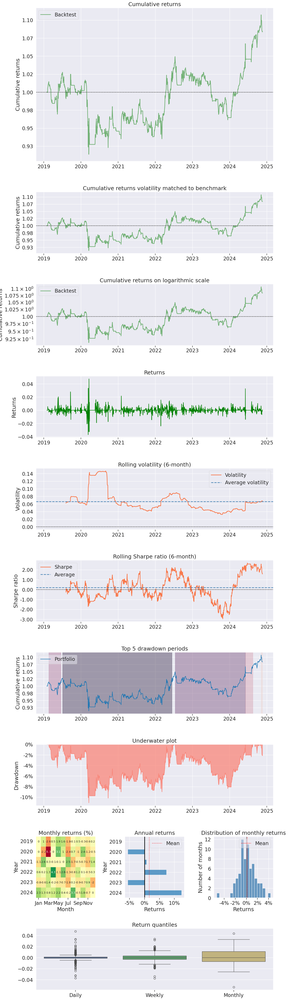

In [1]:
import pandas as pd
import numpy as np
import yfinance as yf
import pyfolio as pf
import matplotlib.pyplot as plt

def calculate_drawdowns(portfolio_values):
    running_max = np.maximum.accumulate(portfolio_values)
    drawdowns = (portfolio_values - running_max) / running_max
    max_drawdown = drawdowns.min()
    return drawdowns, max_drawdown

def run_strategy(initial_cash):
    # Download historical data using yfinance
    ticker = '^NSEI'  # Replace with your preferred ticker
    data = yf.download(ticker, start='2019-01-01', end='2024-12-31')

    # Parameters
    length = 20
    mult = 2.0

    # Bollinger Bands Calculation
    data['basis'] = data['Close'].rolling(window=length).mean()
    data['stddev'] = data['Close'].rolling(window=length).std()
    data['upper_band'] = data['basis'] + (mult * data['stddev'])
    data['lower_band'] = data['basis'] - (mult * data['stddev'])

    # Initialize variables
    trade_in_progress = 0  # 0: No trade, 1: Long, 2: Short
    entry_price = np.nan
    stop_loss = np.nan
    cash = initial_cash  # Track available cash
    stocks_held = 0  # Track stocks held (positive: long, negative: short)
    all_trades = []  # Record all trades
    portfolio_values = []  # Portfolio value after each day
    dates = []  # Dates for portfolio values

    # Flags to ensure only one partial exit is allowed
    long_partial_exit_done = False
    short_partial_exit_done = False

    # Simulate the strategy
    for i in range(length, len(data)):
        current_date = data.index[i]
        close_price = data['Close'].iloc[i]
        high_price = data['High'].iloc[i]
        low_price = data['Low'].iloc[i]
        upper_band = data['upper_band'].iloc[i]
        lower_band = data['lower_band'].iloc[i]
        middle_band = data['basis'].iloc[i]

        # Calculate current portfolio value
        portfolio_value = cash + (stocks_held * close_price)
        portfolio_values.append(portfolio_value)
        dates.append(current_date)

        # Handle long position
        if trade_in_progress == 1:  # Long position active
            if low_price <= stop_loss:  # Stop loss hit
                exit_price = stop_loss
                cash += stocks_held * exit_price
                all_trades.append(('Long Exit (Stop Loss)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Stop Loss Hit at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0
                long_partial_exit_done = False  # Reset flag after exit
            elif low_price <= middle_band <= high_price and not long_partial_exit_done:  # Partial exit at middle band
                exit_price = middle_band
                sell_quantity = stocks_held / 2
                cash += exit_price * sell_quantity
                stocks_held -= sell_quantity
                stop_loss = entry_price  # Move stop loss to breakeven
                all_trades.append(('Long Partial Exit', current_date, exit_price, sell_quantity, cash, portfolio_value))
                print(f"{current_date.date()} - Long 50% Exit at {exit_price:.2f}, Stocks Held: {stocks_held:.4f}")
                long_partial_exit_done = True  # Set flag to indicate partial exit has occurred
            elif high_price >= upper_band:  # Final exit
                exit_price = upper_band
                cash += stocks_held * exit_price
                all_trades.append(('Long Exit', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Final Exit at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0
                long_partial_exit_done = False  # Reset flag after exit

        # Handle short position
        elif trade_in_progress == 2:  # Short position active
            if high_price >= stop_loss:  # Stop loss hit
                exit_price = stop_loss
                cash -= abs(stocks_held) * exit_price
                all_trades.append(('Short Exit (Stop Loss)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Stop Loss Hit at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0
                short_partial_exit_done = False  # Reset flag after exit
            elif low_price <= middle_band <= high_price and not short_partial_exit_done:  # Partial cover at middle band
                exit_price = middle_band
                cover_quantity = abs(stocks_held) / 2
                cash -= exit_price * cover_quantity
                stocks_held += cover_quantity
                stop_loss = entry_price  # Move stop loss to breakeven
                all_trades.append(('Short Partial Exit', current_date, exit_price, cover_quantity, cash, portfolio_value))
                print(f"{current_date.date()} - Short 50% Cover at {exit_price:.2f}, Stocks Held: {stocks_held:.4f}")
                short_partial_exit_done = True  # Set flag to indicate partial exit has occurred
            elif low_price <= lower_band:  # Final cover
                exit_price = lower_band
                cash -= abs(stocks_held) * exit_price
                all_trades.append(('Short Exit', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Final Cover at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0
                short_partial_exit_done = False  # Reset flag after exit

        # Entry conditions
        if trade_in_progress == 0:
            if low_price <= lower_band:  # Long entry
                entry_price = lower_band
                stop_loss = entry_price * 0.99
                trade_in_progress = 1
                stocks_to_buy = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                stocks_held = stocks_to_buy
                cash -= entry_price * stocks_held
                all_trades.append(('Long Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")
                long_partial_exit_done = False  # Reset flag for new trade
            elif high_price >= upper_band:  # Short entry
                entry_price = upper_band
                stop_loss = entry_price * 1.01
                trade_in_progress = 2
                stocks_to_short = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                stocks_held = -stocks_to_short
                cash += entry_price * abs(stocks_held)
                all_trades.append(('Short Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")
                short_partial_exit_done = False  # Reset flag for new trade

    # Create DataFrame for portfolio values
    portfolio_df = pd.DataFrame({'date': dates, 'portfolio_value': portfolio_values})
    portfolio_df.set_index('date', inplace=True)

    # Calculate final cumulative return
    final_value = portfolio_values[-1]
    cumulative_return = ((final_value - initial_cash) / initial_cash) * 100

    # Calculate drawdowns and max drawdown
    drawdowns, max_drawdown = calculate_drawdowns(portfolio_df['portfolio_value'].values)

    # Prepare trade log DataFrame
    trade_log = pd.DataFrame(all_trades, columns=['Type', 'Date', 'Price', 'Quantity', 'Cash', 'Portfolio Value'])

    return portfolio_df, trade_log, final_value, cumulative_return, max_drawdown

def analyze_and_plot(initial_cash):
    portfolio_df, trade_log, final_value, cumulative_return, max_drawdown = run_strategy(initial_cash)

    print(f"\nInitial Cash: ₹{initial_cash:.2f}")
    print(f"Final Portfolio Value: ₹{final_value:.2f}")
    print(f"Final Cumulative Return: {cumulative_return:.2f}%")
    print(f"Max Drawdown: {max_drawdown:.2f}")
    print(f"Number of Trades: {len(trade_log)}")

    # Plot portfolio value over time
    plt.figure(figsize=(12, 6))
    plt.plot(portfolio_df.index, portfolio_df['portfolio_value'])
    plt.title('Portfolio Value Over Time')
    plt.xlabel('Date')
    plt.ylabel('Portfolio Value (₹)')
    plt.grid(True)
    plt.show()

    # Analyze performance using Pyfolio
    portfolio_df['daily_returns'] = portfolio_df['portfolio_value'].pct_change().dropna()
    pf.create_full_tear_sheet(portfolio_df['daily_returns'])

    return portfolio_df, trade_log

# Run the analysis for different initial cash values
initial_cash_values = [2000000, 1000000]

for cash in initial_cash_values:
    analyze_and_plot(cash)

In [ ]:
#5days
#nostoploss



[*********************100%***********************]  1 of 1 completed


2019-05-07 - Long Entry at 11504.52, Stocks Held: 86.9223
2019-05-17 - Long Exit after 5 Days at 11407.15
2019-06-20 - Long Entry at 11635.15, Stocks Held: 85.5827
2019-06-26 - Long 50% Exit at 11852.04, Stocks Held: 42.7914
2019-07-01 - Long Exit after 5 Days at 11865.60
2019-07-08 - Long Entry at 11594.42, Stocks Held: 86.7088
2019-07-18 - Long Exit after 5 Days at 11596.90
2019-07-22 - Long Entry at 11335.21, Stocks Held: 88.7012
2019-08-01 - Long Exit after 5 Days at 10980.00
2019-08-01 - Long Entry at 10968.32, Stocks Held: 90.2319
2019-08-13 - Long Exit after 5 Days at 10925.85
2019-08-22 - Long Entry at 10749.33, Stocks Held: 91.8919
2019-08-26 - Long 50% Exit at 11004.19, Stocks Held: 45.9460
2019-09-03 - Long Exit after 5 Days at 10797.90
2019-09-19 - Long Entry at 10692.59, Stocks Held: 93.0315
2019-09-20 - Long 50% Exit at 10946.32, Stocks Held: 46.5158
2019-09-23 - Long Final Exit at 11380.26
2020-02-03 - Long Entry at 11834.59, Stocks Held: 85.9043
2020-02-06 - Long 50% Ex

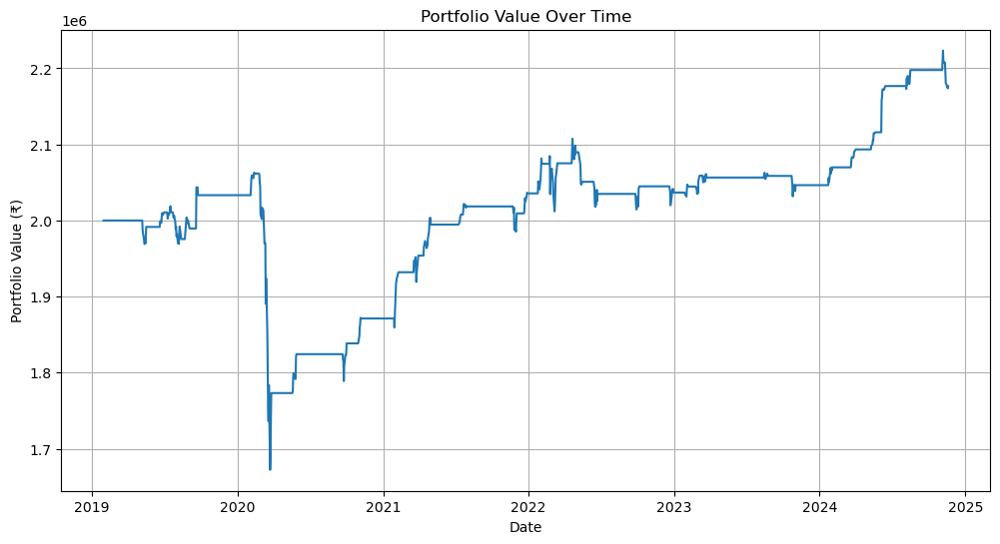

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.503%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,1.503%
Cumulative returns,8.834%
Annual volatility,5.929%
Sharpe ratio,0.28
Calmar ratio,0.08
Stability,0.42
Max drawdown,-18.941%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,18.94,2020-02-12,2020-03-23,2022-02-01,515
1,4.42,2022-04-21,2022-09-29,2024-05-16,541
2,3.49,2022-02-23,2022-03-07,2022-04-20,41
3,2.45,2019-07-17,2019-08-07,2019-09-20,48
4,2.23,2024-11-06,2024-11-18,NaT,NaN


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning:

Passed returns do not overlap with anyinteresting times.

[*********************100%***********************]  1 of 1 completed


2019-05-07 - Long Entry at 11504.52, Stocks Held: 43.4612
2019-05-17 - Long Exit after 5 Days at 11407.15
2019-06-20 - Long Entry at 11635.15, Stocks Held: 42.7914
2019-06-26 - Long 50% Exit at 11852.04, Stocks Held: 21.3957
2019-07-01 - Long Exit after 5 Days at 11865.60
2019-07-08 - Long Entry at 11594.42, Stocks Held: 43.3544
2019-07-18 - Long Exit after 5 Days at 11596.90
2019-07-22 - Long Entry at 11335.21, Stocks Held: 44.3506
2019-08-01 - Long Exit after 5 Days at 10980.00
2019-08-01 - Long Entry at 10968.32, Stocks Held: 45.1160
2019-08-13 - Long Exit after 5 Days at 10925.85
2019-08-22 - Long Entry at 10749.33, Stocks Held: 45.9460
2019-08-26 - Long 50% Exit at 11004.19, Stocks Held: 22.9730
2019-09-03 - Long Exit after 5 Days at 10797.90
2019-09-19 - Long Entry at 10692.59, Stocks Held: 46.5158
2019-09-20 - Long 50% Exit at 10946.32, Stocks Held: 23.2579
2019-09-23 - Long Final Exit at 11380.26
2020-02-03 - Long Entry at 11834.59, Stocks Held: 42.9522
2020-02-06 - Long 50% Ex

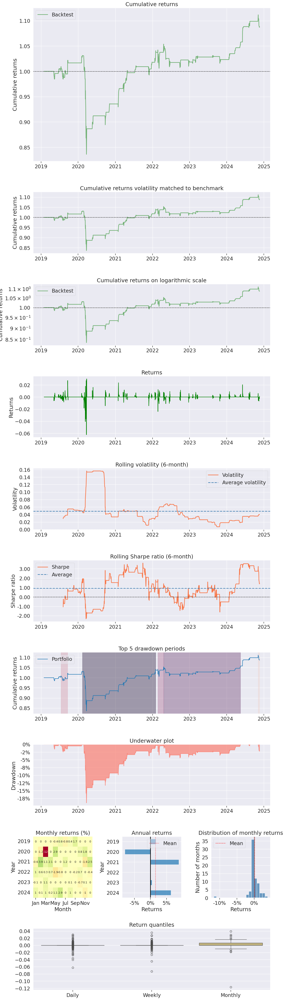

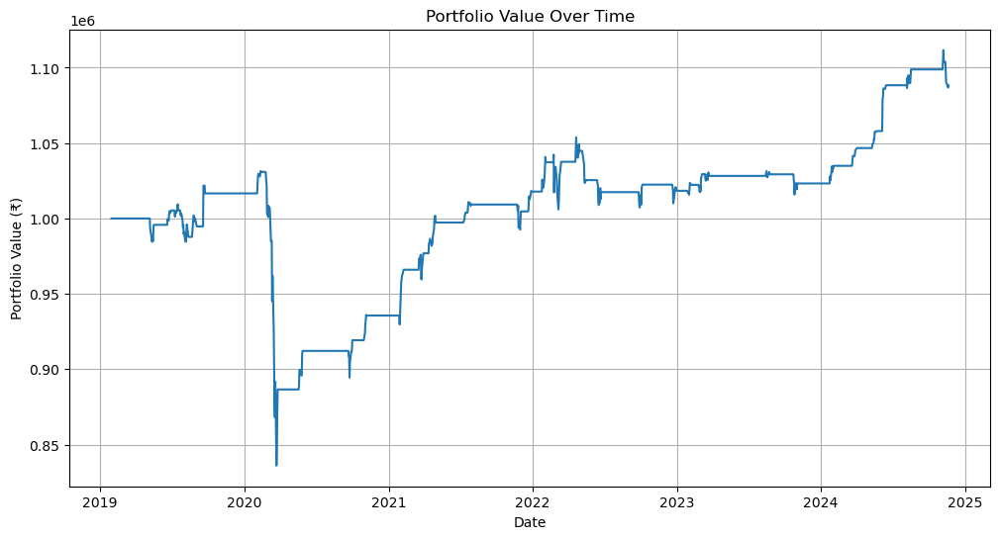

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.503%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,1.503%
Cumulative returns,8.834%
Annual volatility,5.929%
Sharpe ratio,0.28
Calmar ratio,0.08
Stability,0.42
Max drawdown,-18.941%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,18.94,2020-02-12,2020-03-23,2022-02-01,515
1,4.42,2022-04-21,2022-09-29,2024-05-16,541
2,3.49,2022-02-23,2022-03-07,2022-04-20,41
3,2.45,2019-07-17,2019-08-07,2019-09-20,48
4,2.23,2024-11-06,2024-11-18,NaT,NaN


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning:

Passed returns do not overlap with anyinteresting times.



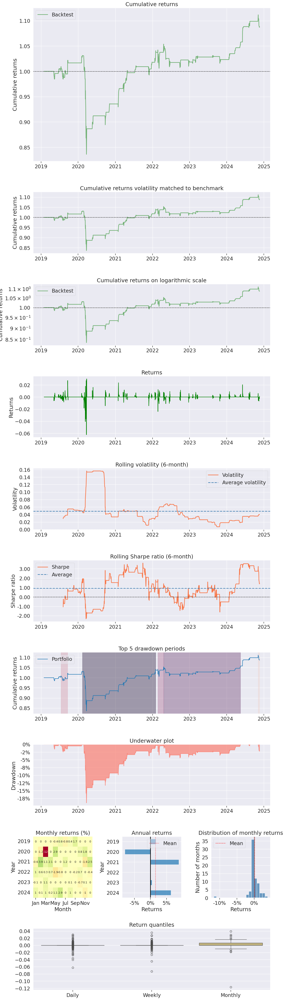

In [14]:
    import pandas as pd
    import numpy as np
    import yfinance as yf
    import pyfolio as pf
    import matplotlib.pyplot as plt
    
    def calculate_drawdowns(portfolio_values):
        running_max = np.maximum.accumulate(portfolio_values)
        drawdowns = (portfolio_values - running_max) / running_max
        max_drawdown = drawdowns.min()
        return drawdowns, max_drawdown
    
    def run_strategy(initial_cash):
        # Download historical data using yfinance
        ticker = '^NSEI'  # Replace with your preferred ticker
        data = yf.download(ticker, start='2019-01-01', end='2024-12-31')
    
        # Parameters
        length = 20
        mult = 2.0
    
        # Bollinger Bands Calculation
        data['basis'] = data['Close'].rolling(window=length).mean()
        data['stddev'] = data['Close'].rolling(window=length).std()
        data['upper_band'] = data['basis'] + (mult * data['stddev'])
        data['lower_band'] = data['basis'] - (mult * data['stddev'])
    
        # Initialize variables
        trade_in_progress = 0  # 0: No trade, 1: Long, 2: Short
        entry_price = np.nan
        entry_date = None  # Track entry date
        cash = initial_cash  # Track available cash
        stocks_held = 0  # Track stocks held (positive: long, negative: short)
        all_trades = []  # Record all trades
        portfolio_values = []  # Portfolio value after each day
        dates = []  # Dates for portfolio values
    
        # Flags to ensure only one partial exit is allowed
        long_partial_exit_done = False
        short_partial_exit_done = False
    
        # Simulate the strategy
        for i in range(length, len(data)):
            current_date = data.index[i]
            close_price = data['Close'].iloc[i]
            high_price = data['High'].iloc[i]
            low_price = data['Low'].iloc[i]
            upper_band = data['upper_band'].iloc[i]
            lower_band = data['lower_band'].iloc[i]
            middle_band = data['basis'].iloc[i]
    
            # Calculate current portfolio value
            portfolio_value = cash + (stocks_held * close_price)
            portfolio_values.append(portfolio_value)
            dates.append(current_date)
    
            # Handle long position
            if trade_in_progress == 1:  # Long position active
                # Exit after 5 days
                if (current_date - entry_date).days >= 10:  # 5 days passed since entry
                    exit_price = close_price  # Exit at current price
                    cash += stocks_held * exit_price
                    all_trades.append(('Long Exit (10 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                    print(f"{current_date.date()} - Long Exit after 5 Days at {exit_price:.2f}")
                    trade_in_progress = 0
                    stocks_held = 0
                    long_partial_exit_done = False  # Reset flag after exit
                elif low_price <= middle_band <= high_price and not long_partial_exit_done:  # Partial exit at middle band
                    exit_price = middle_band
                    sell_quantity = stocks_held / 2
                    cash += exit_price * sell_quantity
                    stocks_held -= sell_quantity
                    all_trades.append(('Long Partial Exit', current_date, exit_price, sell_quantity, cash, portfolio_value))
                    print(f"{current_date.date()} - Long 50% Exit at {exit_price:.2f}, Stocks Held: {stocks_held:.4f}")
                    long_partial_exit_done = True  # Set flag to indicate partial exit has occurred
                elif high_price >= upper_band:  # Final exit
                    exit_price = upper_band
                    cash += stocks_held * exit_price
                    all_trades.append(('Long Final Exit', current_date, exit_price, stocks_held, cash, portfolio_value))
                    print(f"{current_date.date()} - Long Final Exit at {exit_price:.2f}")
                    trade_in_progress = 0
                    stocks_held = 0
                    long_partial_exit_done = False  # Reset flag after exit
    
            # Handle short position
            
            elif trade_in_progress == 2:  # Short position active
                # Exit after 5 days
                if (current_date - entry_date).days >= 10:  # 5 days passed since entry
                    exit_price = close_price  # Exit at current price
                    cash -= abs(stocks_held) * exit_price
                    all_trades.append(('Short Exit (10 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                    print(f"{current_date.date()} - Short Exit after 5 Days at {exit_price:.2f}")
                    trade_in_progress = 0
                    stocks_held = 0
                    short_partial_exit_done = False  # Reset flag after exit
                elif low_price <= middle_band <= high_price and not short_partial_exit_done:  # Partial cover at middle band
                    exit_price = middle_band
                    cover_quantity = abs(stocks_held) / 2
                    cash -= exit_price * cover_quantity
                    stocks_held += cover_quantity
                    all_trades.append(('Short Partial Exit', current_date, exit_price, cover_quantity, cash, portfolio_value))
                    print(f"{current_date.date()} - Short 50% Cover at {exit_price:.2f}, Stocks Held: {stocks_held:.4f}")
                    short_partial_exit_done = True  # Set flag to indicate partial exit has occurred
                elif low_price <= lower_band:  # Final cover
                    exit_price = lower_band
                    cash -= abs(stocks_held) * exit_price
                    all_trades.append(('Short Final Cover', current_date, exit_price, stocks_held, cash, portfolio_value))
                    print(f"{current_date.date()} - Short Final Cover at {exit_price:.2f}")
                    trade_in_progress = 0
                    stocks_held = 0
                    short_partial_exit_done = False  # Reset flag after exit
    
            # Entry conditions
            if trade_in_progress == 0:
                if low_price <= lower_band:  # Long entry
                    entry_price = lower_band
                    entry_date = current_date  # Set entry date
                    trade_in_progress = 1
                    stocks_to_buy = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                    stocks_held = stocks_to_buy
                    cash -= entry_price * stocks_held
                    all_trades.append(('Long Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                    print(f"{current_date.date()} - Long Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")
                    long_partial_exit_done = False  # Reset flag for new trade
                 elif high_price >= upper_band:  # Short entry
                    entry_price = upper_band
                    entry_date = current_date  # Set entry date
                    trade_in_progress = 2
                    stocks_to_short = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                    stocks_held = -stocks_to_short
                    cash += entry_price * abs(stocks_held)
                    all_trades.append(('Short Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                    print(f"{current_date.date()} - Short Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")
                    short_partial_exit_done = False  # Reset flag for new trade
                
        # Create DataFrame for portfolio values
        portfolio_df = pd.DataFrame({'date': dates, 'portfolio_value': portfolio_values})
        portfolio_df.set_index('date', inplace=True)
    
        # Calculate final cumulative return
        final_value = portfolio_values[-1]
        cumulative_return = ((final_value - initial_cash) / initial_cash) * 100
    
        # Calculate drawdowns and max drawdown
        drawdowns, max_drawdown = calculate_drawdowns(portfolio_df['portfolio_value'].values)
    
        # Prepare trade log DataFrame
        trade_log = pd.DataFrame(all_trades, columns=['Type', 'Date', 'Price', 'Quantity', 'Cash', 'Portfolio Value'])
    
        return portfolio_df, trade_log, final_value, cumulative_return, max_drawdown
    
    def analyze_and_plot(initial_cash):
        portfolio_df, trade_log, final_value, cumulative_return, max_drawdown = run_strategy(initial_cash)
    
        print(f"\nInitial Cash: ₹{initial_cash:.2f}")
        print(f"Final Portfolio Value: ₹{final_value:.2f}")
        print(f"Final Cumulative Return: {cumulative_return:.2f}%")
        print(f"Max Drawdown: {max_drawdown:.2f}")
        print(f"Number of Trades: {len(trade_log)}")
    
        # Plot portfolio value over time
        plt.figure(figsize=(12, 6))
        plt.plot(portfolio_df.index, portfolio_df['portfolio_value'])
        plt.title('Portfolio Value Over Time')
        plt.xlabel('Date')
        plt.ylabel('Portfolio Value (₹)')
        plt.grid(True)
        plt.show()
    
        # Analyze performance using Pyfolio
        portfolio_df['daily_returns'] = portfolio_df['portfolio_value'].pct_change().dropna()
        pf.create_full_tear_sheet(portfolio_df['daily_returns'])
    
        return portfolio_df, trade_log
    
    # Run the analysis for different initial cash values
    initial_cash_values = [2000000, 1000000]
    
    for cash in initial_cash_values:
        analyze_and_plot(cash)


In [ ]:
#only long 
#only short 

[*********************100%***********************]  1 of 1 completed


2019-02-06 - Long Entry at 11059.86, Stocks Held: 90.4170
2019-02-11 - Long Exit after 5 Days at 10888.80
2019-03-11 - Long Entry at 11150.94, Stocks Held: 88.9850
2019-03-18 - Long Exit after 5 Days at 11462.20
2019-03-18 - Long Entry at 11527.06, Stocks Held: 87.2829
2019-03-25 - Long Exit after 5 Days at 11354.25
2019-04-16 - Long Entry at 11799.37, Stocks Held: 84.6294
2019-04-22 - Long Exit after 5 Days at 11594.45
2019-05-07 - Short Entry at 11504.52, Stocks Held: -86.0446
2019-05-13 - Short Exit after 5 Days at 11148.20
2019-05-13 - Short Entry at 11224.17, Stocks Held: -89.5596
2019-05-20 - Short Exit after 5 Days at 11828.25
2019-05-23 - Long Entry at 11986.54, Stocks Held: 81.6067
2019-05-28 - Long Exit after 5 Days at 11928.75
2019-06-20 - Short Entry at 11635.15, Stocks Held: -83.8686
2019-06-25 - Short Exit after 5 Days at 11796.45
2019-07-08 - Short Entry at 11594.42, Stocks Held: -83.5798
2019-07-15 - Short Exit after 5 Days at 11588.35
2019-07-22 - Short Entry at 11335.

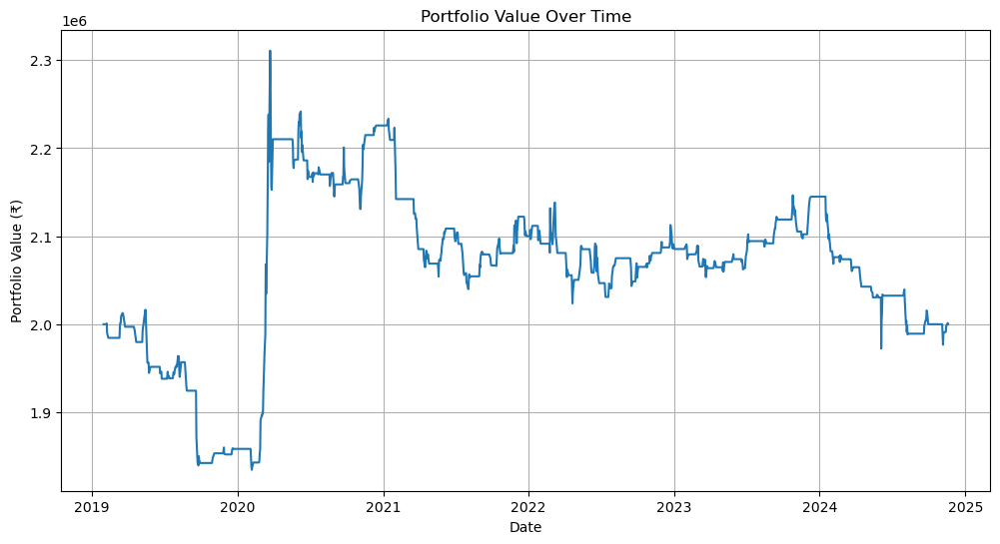

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,0.0%
Cumulative returns,0.001%
Annual volatility,6.644%
Sharpe ratio,0.03
Calmar ratio,0.00
Stability,0.05
Max drawdown,-14.643%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,14.64,2020-03-23,2024-06-04,NaT,NaN
1,9.02,2019-05-15,2020-02-06,2020-03-12,217
2,2.39,2020-03-19,2020-03-20,2020-03-23,3
3,1.63,2019-03-19,2019-04-22,2019-05-15,42
4,1.63,2020-03-12,2020-03-13,2020-03-16,3


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning:

Passed returns do not overlap with anyinteresting times.

[*********************100%***********************]  1 of 1 completed


2019-02-06 - Long Entry at 11059.86, Stocks Held: 45.2085
2019-02-11 - Long Exit after 5 Days at 10888.80
2019-03-11 - Long Entry at 11150.94, Stocks Held: 44.4925
2019-03-18 - Long Exit after 5 Days at 11462.20
2019-03-18 - Long Entry at 11527.06, Stocks Held: 43.6415
2019-03-25 - Long Exit after 5 Days at 11354.25
2019-04-16 - Long Entry at 11799.37, Stocks Held: 42.3147
2019-04-22 - Long Exit after 5 Days at 11594.45
2019-05-07 - Short Entry at 11504.52, Stocks Held: -43.0223
2019-05-13 - Short Exit after 5 Days at 11148.20
2019-05-13 - Short Entry at 11224.17, Stocks Held: -44.7798
2019-05-20 - Short Exit after 5 Days at 11828.25
2019-05-23 - Long Entry at 11986.54, Stocks Held: 40.8033
2019-05-28 - Long Exit after 5 Days at 11928.75
2019-06-20 - Short Entry at 11635.15, Stocks Held: -41.9343
2019-06-25 - Short Exit after 5 Days at 11796.45
2019-07-08 - Short Entry at 11594.42, Stocks Held: -41.7899
2019-07-15 - Short Exit after 5 Days at 11588.35
2019-07-22 - Short Entry at 11335.

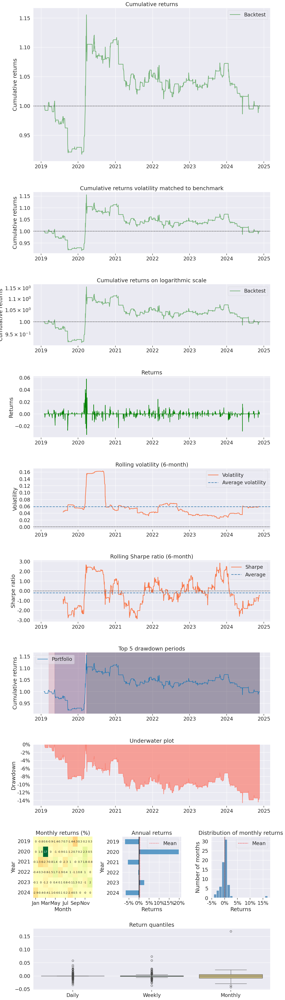

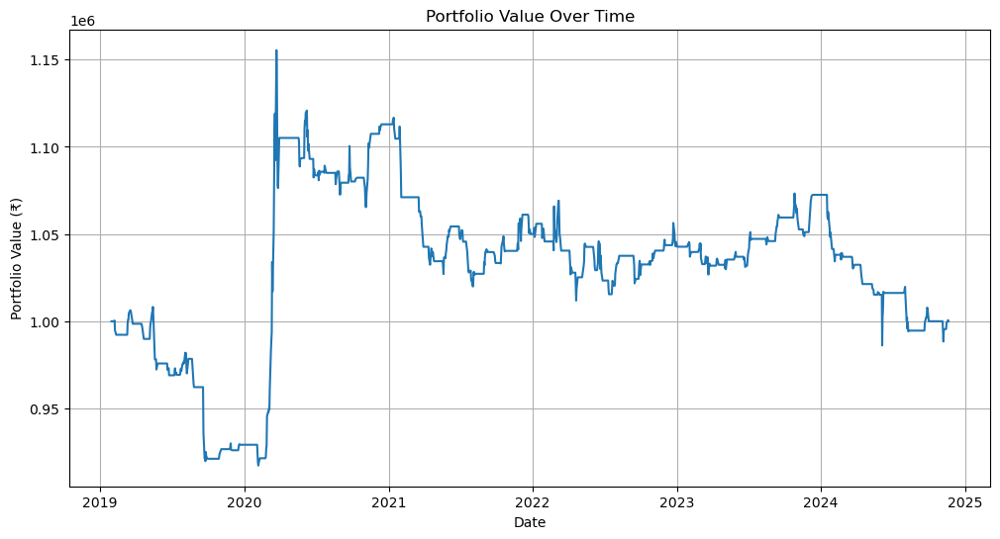

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,0.0%
Cumulative returns,0.001%
Annual volatility,6.644%
Sharpe ratio,0.03
Calmar ratio,0.00
Stability,0.05
Max drawdown,-14.643%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,14.64,2020-03-23,2024-06-04,NaT,NaN
1,9.02,2019-05-15,2020-02-06,2020-03-12,217
2,2.39,2020-03-19,2020-03-20,2020-03-23,3
3,1.63,2019-03-19,2019-04-22,2019-05-15,42
4,1.63,2020-03-12,2020-03-13,2020-03-16,3


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning:

Passed returns do not overlap with anyinteresting times.



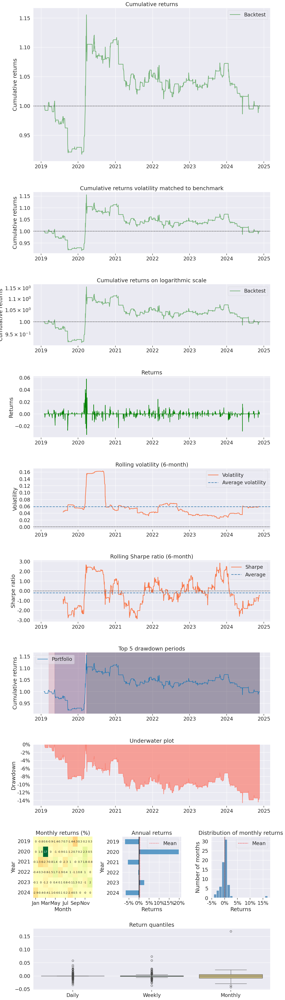

In [23]:
import pandas as pd
import numpy as np
import yfinance as yf
import pyfolio as pf
import matplotlib.pyplot as plt

def calculate_drawdowns(portfolio_values):
    running_max = np.maximum.accumulate(portfolio_values)
    drawdowns = (portfolio_values - running_max) / running_max
    max_drawdown = drawdowns.min()
    return drawdowns, max_drawdown

def run_strategy(initial_cash):
    # Download historical data using yfinance
    ticker = '^NSEI'  # Replace with your preferred ticker
    data = yf.download(ticker, start='2019-01-01', end='2024-12-31')

    # Parameters
    length = 20
    mult = 2.0

    # Bollinger Bands Calculation
    data['basis'] = data['Close'].rolling(window=length).mean()
    data['stddev'] = data['Close'].rolling(window=length).std()
    data['upper_band'] = data['basis'] + (mult * data['stddev'])
    data['lower_band'] = data['basis'] - (mult * data['stddev'])

    # Initialize variables
    trade_in_progress = 0  # 0: No trade, 1: Long, 2: Short
    entry_price = np.nan
    entry_date = None  # Track entry date
    cash = initial_cash  # Track available cash
    stocks_held = 0  # Track stocks held (positive: long, negative: short)
    all_trades = []  # Record all trades
    portfolio_values = []  # Portfolio value after each day
    dates = []  # Dates for portfolio values

    # Simulate the strategy
    for i in range(length, len(data)):
        current_date = data.index[i]
        close_price = data['Close'].iloc[i]
        high_price = data['High'].iloc[i]
        low_price = data['Low'].iloc[i]
        upper_band = data['upper_band'].iloc[i]
        lower_band = data['lower_band'].iloc[i]
        middle_band = data['basis'].iloc[i]

        # Calculate current portfolio value
        portfolio_value = cash + (stocks_held * close_price)
        portfolio_values.append(portfolio_value)
        dates.append(current_date)

        # Handle long position
        if trade_in_progress == 1:  # Long position active
            # Exit after 5 days
            if (current_date - entry_date).days >= 5:  # 5 days passed since entry
                exit_price = close_price  # Exit at current price
                cash += stocks_held * exit_price
                all_trades.append(('Long Exit (5 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Exit after 5 Days at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0

        # Handle short position
        elif trade_in_progress == 2:  # Short position active
            # Exit after 5 days
            if (current_date - entry_date).days >= 5:  # 5 days passed since entry
                exit_price = close_price  # Exit at current price
                cash -= abs(stocks_held) * exit_price
                all_trades.append(('Short Exit (5 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Exit after 5 Days at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0

        # Entry conditions
        if trade_in_progress == 0:
            if high_price >= upper_band:  # Long entry at Upper Band
                entry_price = upper_band
                entry_date = current_date  # Set entry date
                trade_in_progress = 1
                stocks_to_buy = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                stocks_held = stocks_to_buy
                cash -= entry_price * stocks_held
                all_trades.append(('Long Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")

            elif low_price <= lower_band:  # Short entry at Lower Band
                entry_price = lower_band
                entry_date = current_date  # Set entry date
                trade_in_progress = 2
                stocks_to_short = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                stocks_held = -stocks_to_short
                cash += entry_price * abs(stocks_held)
                all_trades.append(('Short Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")

    # Create DataFrame for portfolio values
    portfolio_df = pd.DataFrame({'date': dates, 'portfolio_value': portfolio_values})
    portfolio_df.set_index('date', inplace=True)

    # Calculate final cumulative return
    final_value = portfolio_values[-1]
    cumulative_return = ((final_value - initial_cash) / initial_cash) * 100

    # Calculate drawdowns and max drawdown
    drawdowns, max_drawdown = calculate_drawdowns(portfolio_df['portfolio_value'].values)

    # Prepare trade log DataFrame
    trade_log = pd.DataFrame(all_trades, columns=['Type', 'Date', 'Price', 'Quantity', 'Cash', 'Portfolio Value'])

    return portfolio_df, trade_log, final_value, cumulative_return, max_drawdown

def analyze_and_plot(initial_cash):
    portfolio_df, trade_log, final_value, cumulative_return, max_drawdown = run_strategy(initial_cash)

    print(f"\nInitial Cash: ₹{initial_cash:.2f}")
    print(f"Final Portfolio Value: ₹{final_value:.2f}")
    print(f"Final Cumulative Return: {cumulative_return:.2f}%")
    print(f"Max Drawdown: {max_drawdown:.2f}")
    print(f"Number of Trades: {len(trade_log)}")

    # Plot portfolio value over time
    plt.figure(figsize=(12, 6))
    plt.plot(portfolio_df.index, portfolio_df['portfolio_value'])
    plt.title('Portfolio Value Over Time')
    plt.xlabel('Date')
    plt.ylabel('Portfolio Value (₹)')
    plt.grid(True)
    plt.show()

    # Analyze performance using Pyfolio
    portfolio_df['daily_returns'] = portfolio_df['portfolio_value'].pct_change().dropna()
    pf.create_full_tear_sheet(portfolio_df['daily_returns'])

    return portfolio_df, trade_log

# Run the analysis for different initial cash values
initial_cash_values = [2000000, 1000000]

for cash in initial_cash_values:
    analyze_and_plot(cash)


[*********************100%***********************]  1 of 1 completed


2019-02-06 - Long Entry at 11059.86, Stocks Held: 90.4170
2019-02-11 - Long Exit after 5 Days at 10888.80
2019-03-11 - Long Entry at 11150.94, Stocks Held: 88.9850
2019-03-18 - Long Exit after 5 Days at 11462.20
2019-03-18 - Long Entry at 11527.06, Stocks Held: 87.2829
2019-03-25 - Long Exit after 5 Days at 11354.25
2019-04-16 - Long Entry at 11799.37, Stocks Held: 84.6294
2019-04-22 - Long Exit after 5 Days at 11594.45
2019-05-23 - Long Entry at 11986.54, Stocks Held: 82.5845
2019-05-28 - Long Exit after 5 Days at 11928.75
2019-09-20 - Long Entry at 11228.24, Stocks Held: 87.9493
2019-09-25 - Long Exit after 5 Days at 11440.20
2019-09-25 - Long Entry at 11547.45, Stocks Held: 86.3253
2019-09-30 - Long Exit after 5 Days at 11474.45
2019-10-29 - Long Entry at 11800.18, Stocks Held: 84.2094
2019-11-04 - Long Exit after 5 Days at 11941.30
2019-11-26 - Long Entry at 12064.89, Stocks Held: 82.8543
2019-12-02 - Long Exit after 5 Days at 12048.20
2019-12-17 - Long Entry at 12179.72, Stocks He

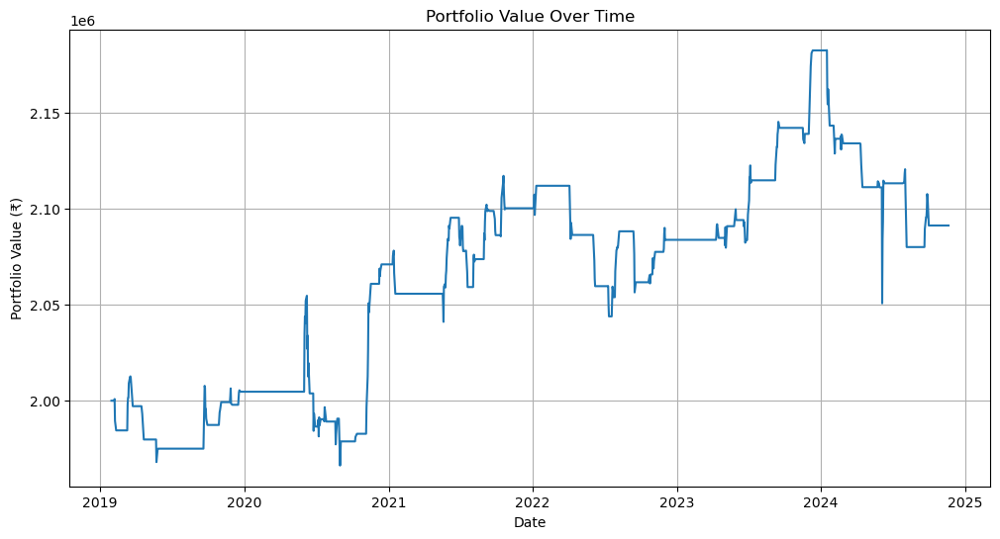

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.789%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,0.789%
Cumulative returns,4.563%
Annual volatility,3.121%
Sharpe ratio,0.27
Calmar ratio,0.13
Stability,0.73
Max drawdown,-6.042%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,6.04,2024-01-16,2024-06-04,NaT,NaN
1,4.30,2020-06-08,2020-08-31,2020-11-17,117
2,3.46,2021-10-19,2022-07-13,2023-07-06,448
3,2.22,2019-03-19,2019-05-24,2020-06-02,316
4,1.78,2021-01-14,2021-05-20,2021-05-31,98


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning:

Passed returns do not overlap with anyinteresting times.

[*********************100%***********************]  1 of 1 completed


2019-02-06 - Long Entry at 11059.86, Stocks Held: 45.2085
2019-02-11 - Long Exit after 5 Days at 10888.80
2019-03-11 - Long Entry at 11150.94, Stocks Held: 44.4925
2019-03-18 - Long Exit after 5 Days at 11462.20
2019-03-18 - Long Entry at 11527.06, Stocks Held: 43.6415
2019-03-25 - Long Exit after 5 Days at 11354.25
2019-04-16 - Long Entry at 11799.37, Stocks Held: 42.3147
2019-04-22 - Long Exit after 5 Days at 11594.45
2019-05-23 - Long Entry at 11986.54, Stocks Held: 41.2923
2019-05-28 - Long Exit after 5 Days at 11928.75
2019-09-20 - Long Entry at 11228.24, Stocks Held: 43.9747
2019-09-25 - Long Exit after 5 Days at 11440.20
2019-09-25 - Long Entry at 11547.45, Stocks Held: 43.1626
2019-09-30 - Long Exit after 5 Days at 11474.45
2019-10-29 - Long Entry at 11800.18, Stocks Held: 42.1047
2019-11-04 - Long Exit after 5 Days at 11941.30
2019-11-26 - Long Entry at 12064.89, Stocks Held: 41.4272
2019-12-02 - Long Exit after 5 Days at 12048.20
2019-12-17 - Long Entry at 12179.72, Stocks He

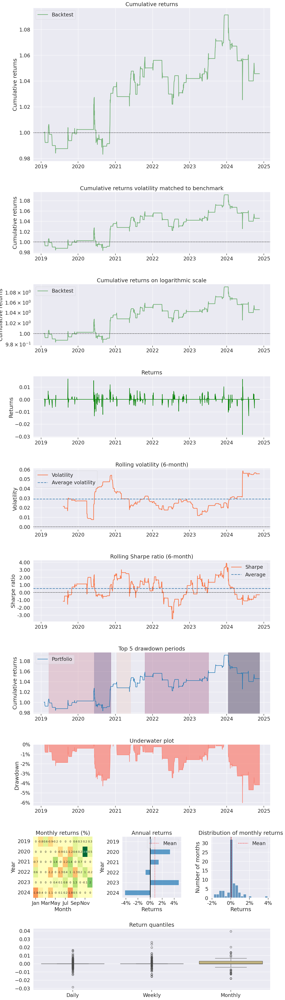

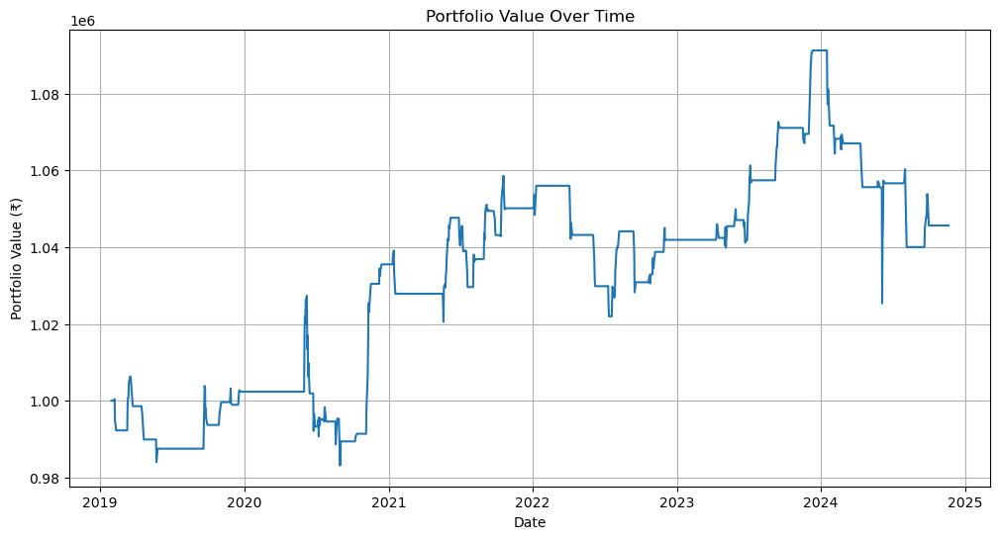

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.789%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,0.789%
Cumulative returns,4.563%
Annual volatility,3.121%
Sharpe ratio,0.27
Calmar ratio,0.13
Stability,0.73
Max drawdown,-6.042%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,6.04,2024-01-16,2024-06-04,NaT,NaN
1,4.30,2020-06-08,2020-08-31,2020-11-17,117
2,3.46,2021-10-19,2022-07-13,2023-07-06,448
3,2.22,2019-03-19,2019-05-24,2020-06-02,316
4,1.78,2021-01-14,2021-05-20,2021-05-31,98


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning:

Passed returns do not overlap with anyinteresting times.



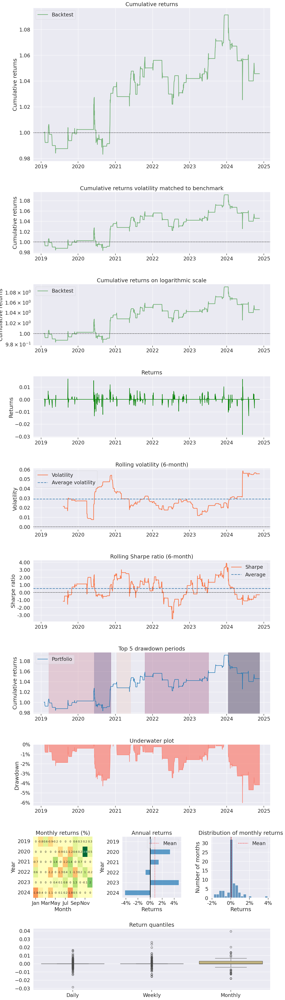

In [26]:
import pandas as pd
import numpy as np
import yfinance as yf
import pyfolio as pf
import matplotlib.pyplot as plt

def calculate_drawdowns(portfolio_values):
    running_max = np.maximum.accumulate(portfolio_values)
    drawdowns = (portfolio_values - running_max) / running_max
    max_drawdown = drawdowns.min()
    return drawdowns, max_drawdown

def run_strategy(initial_cash):
    # Download historical data using yfinance
    ticker = '^NSEI'  # Replace with your preferred ticker
    data = yf.download(ticker, start='2019-01-01', end='2024-12-31')

    # Parameters
    length = 20
    mult = 2.0

    # Bollinger Bands Calculation
    data['basis'] = data['Close'].rolling(window=length).mean()
    data['stddev'] = data['Close'].rolling(window=length).std()
    data['upper_band'] = data['basis'] + (mult * data['stddev'])
    data['lower_band'] = data['basis'] - (mult * data['stddev'])

    # Initialize variables
    trade_in_progress = 0  # 0: No trade, 1: Long, 2: Short
    entry_price = np.nan
    entry_date = None  # Track entry date
    cash = initial_cash  # Track available cash
    stocks_held = 0  # Track stocks held (positive: long, negative: short)
    all_trades = []  # Record all trades
    portfolio_values = []  # Portfolio value after each day
    dates = []  # Dates for portfolio values

    # Simulate the strategy
    for i in range(length, len(data)):
        current_date = data.index[i]
        close_price = data['Close'].iloc[i]
        high_price = data['High'].iloc[i]
        low_price = data['Low'].iloc[i]
        upper_band = data['upper_band'].iloc[i]
        lower_band = data['lower_band'].iloc[i]
        middle_band = data['basis'].iloc[i]

        # Calculate current portfolio value
        portfolio_value = cash + (stocks_held * close_price)
        portfolio_values.append(portfolio_value)
        dates.append(current_date)

        # Handle long position
        if trade_in_progress == 1:  # Long position active
            # Exit after 5 days
            if (current_date - entry_date).days >= 5:  # 5 days passed since entry
                exit_price = close_price  # Exit at current price
                cash += stocks_held * exit_price
                all_trades.append(('Long Exit (5 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Exit after 5 Days at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0

'''     # Handle short position
        elif trade_in_progress == 2:  # Short position active
            # Exit after 5 days
            if (current_date - entry_date).days >= 5:  # 5 days passed since entry
                exit_price = close_price  # Exit at current price
                cash -= abs(stocks_held) * exit_price
                all_trades.append(('Short Exit (5 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Exit after 5 Days at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0

        # Entry conditions
        if trade_in_progress == 0:
            if high_price >= upper_band:  # Long entry at Upper Band
                entry_price = upper_band
                entry_date = current_date  # Set entry date
                trade_in_progress = 1
                stocks_to_buy = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                stocks_held = stocks_to_buy
                cash -= entry_price * stocks_held
                all_trades.append(('Long Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")
'''
            elif low_price <= lower_band:  # Short entry at Lower Band
                entry_price = lower_band
                entry_date = current_date  # Set entry date
                trade_in_progress = 2
                stocks_to_short = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                stocks_held = -stocks_to_short
                cash += entry_price * abs(stocks_held)
                all_trades.append(('Short Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")
'''
    # Create DataFrame for portfolio values
    portfolio_df = pd.DataFrame({'date': dates, 'portfolio_value': portfolio_values})
    portfolio_df.set_index('date', inplace=True)

    # Calculate final cumulative return
    final_value = portfolio_values[-1]
    cumulative_return = ((final_value - initial_cash) / initial_cash) * 100

    # Calculate drawdowns and max drawdown
    drawdowns, max_drawdown = calculate_drawdowns(portfolio_df['portfolio_value'].values)

    # Prepare trade log DataFrame
    trade_log = pd.DataFrame(all_trades, columns=['Type', 'Date', 'Price', 'Quantity', 'Cash', 'Portfolio Value'])

    return portfolio_df, trade_log, final_value, cumulative_return, max_drawdown

def analyze_and_plot(initial_cash):
    portfolio_df, trade_log, final_value, cumulative_return, max_drawdown = run_strategy(initial_cash)

    print(f"\nInitial Cash: ₹{initial_cash:.2f}")
    print(f"Final Portfolio Value: ₹{final_value:.2f}")
    print(f"Final Cumulative Return: {cumulative_return:.2f}%")
    print(f"Max Drawdown: {max_drawdown:.2f}")
    print(f"Number of Trades: {len(trade_log)}")

    # Plot portfolio value over time
    plt.figure(figsize=(12, 6))
    plt.plot(portfolio_df.index, portfolio_df['portfolio_value'])
    plt.title('Portfolio Value Over Time')
    plt.xlabel('Date')
    plt.ylabel('Portfolio Value (₹)')
    plt.grid(True)
    plt.show()

    # Analyze performance using Pyfolio
    portfolio_df['daily_returns'] = portfolio_df['portfolio_value'].pct_change().dropna()
    pf.create_full_tear_sheet(portfolio_df['daily_returns'])

    return portfolio_df, trade_log

# Run the analysis for different initial cash values
initial_cash_values = [2000000, 1000000]

for cash in initial_cash_values:
    analyze_and_plot(cash)


[*********************100%***********************]  1 of 1 completed


2019-02-06 - Long Entry at 11059.86, Stocks Held: 180.8341
2019-02-11 - Long Exit after 5 Days at 10888.80
2019-03-11 - Long Entry at 11150.94, Stocks Held: 176.5830
2019-03-18 - Long Exit after 5 Days at 11462.20
2019-03-18 - Long Entry at 11527.06, Stocks Held: 175.5894
2019-03-25 - Long Exit after 5 Days at 11354.25
2019-04-16 - Long Entry at 11799.37, Stocks Held: 168.9654
2019-04-22 - Long Exit after 5 Days at 11594.45
2019-05-23 - Long Entry at 11986.54, Stocks Held: 163.4385
2019-05-28 - Long Exit after 5 Days at 11928.75
2019-09-20 - Long Entry at 11228.24, Stocks Held: 173.6351
2019-09-25 - Long Exit after 5 Days at 11440.20
2019-09-25 - Long Entry at 11547.45, Stocks Held: 172.0224
2019-09-30 - Long Exit after 5 Days at 11474.45
2019-10-29 - Long Entry at 11800.18, Stocks Held: 167.2739
2019-11-04 - Long Exit after 5 Days at 11941.30
2019-11-26 - Long Entry at 12064.89, Stocks Held: 165.5605
2019-12-02 - Long Exit after 5 Days at 12048.20
2019-12-17 - Long Entry at 12179.72, 

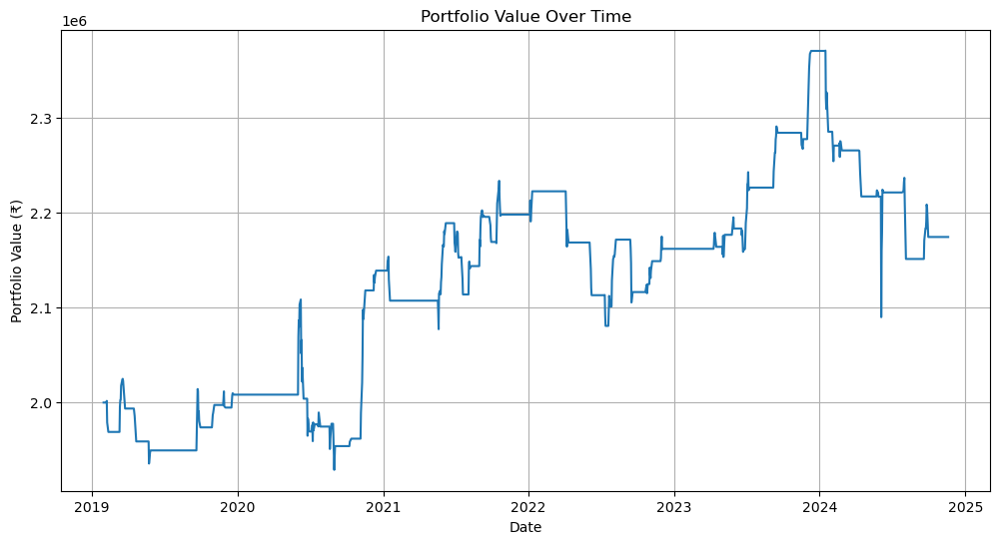

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.483%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,1.483%
Cumulative returns,8.714%
Annual volatility,6.254%
Sharpe ratio,0.27
Calmar ratio,0.13
Stability,0.72
Max drawdown,-11.835%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,11.84,2024-01-16,2024-06-04,NaT,NaN
1,8.50,2020-06-08,2020-08-31,2020-11-17,117
2,6.84,2021-10-19,2022-07-13,2023-07-06,448
3,4.40,2019-03-19,2019-05-24,2020-06-02,316
4,3.55,2021-01-14,2021-05-20,2021-05-31,98


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning:

Passed returns do not overlap with anyinteresting times.

[*********************100%***********************]  1 of 1 completed


2019-02-06 - Long Entry at 11059.86, Stocks Held: 90.4170
2019-02-11 - Long Exit after 5 Days at 10888.80
2019-03-11 - Long Entry at 11150.94, Stocks Held: 88.2915
2019-03-18 - Long Exit after 5 Days at 11462.20
2019-03-18 - Long Entry at 11527.06, Stocks Held: 87.7947
2019-03-25 - Long Exit after 5 Days at 11354.25
2019-04-16 - Long Entry at 11799.37, Stocks Held: 84.4827
2019-04-22 - Long Exit after 5 Days at 11594.45
2019-05-23 - Long Entry at 11986.54, Stocks Held: 81.7192
2019-05-28 - Long Exit after 5 Days at 11928.75
2019-09-20 - Long Entry at 11228.24, Stocks Held: 86.8175
2019-09-25 - Long Exit after 5 Days at 11440.20
2019-09-25 - Long Entry at 11547.45, Stocks Held: 86.0112
2019-09-30 - Long Exit after 5 Days at 11474.45
2019-10-29 - Long Entry at 11800.18, Stocks Held: 83.6370
2019-11-04 - Long Exit after 5 Days at 11941.30
2019-11-26 - Long Entry at 12064.89, Stocks Held: 82.7802
2019-12-02 - Long Exit after 5 Days at 12048.20
2019-12-17 - Long Entry at 12179.72, Stocks He

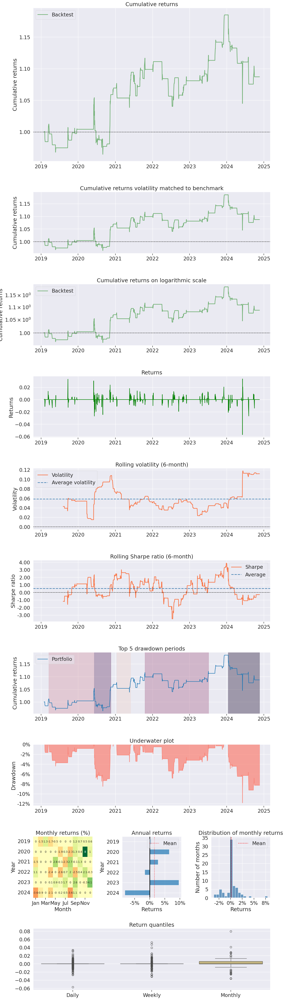

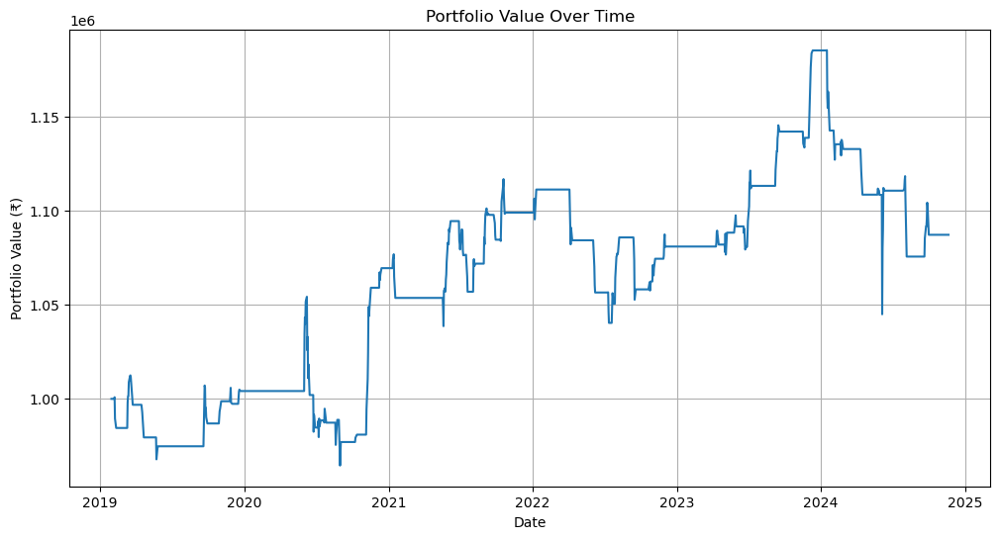

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.483%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,1.483%
Cumulative returns,8.714%
Annual volatility,6.254%
Sharpe ratio,0.27
Calmar ratio,0.13
Stability,0.72
Max drawdown,-11.835%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,11.84,2024-01-16,2024-06-04,NaT,NaN
1,8.50,2020-06-08,2020-08-31,2020-11-17,117
2,6.84,2021-10-19,2022-07-13,2023-07-06,448
3,4.40,2019-03-19,2019-05-24,2020-06-02,316
4,3.55,2021-01-14,2021-05-20,2021-05-31,98


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning:

Passed returns do not overlap with anyinteresting times.



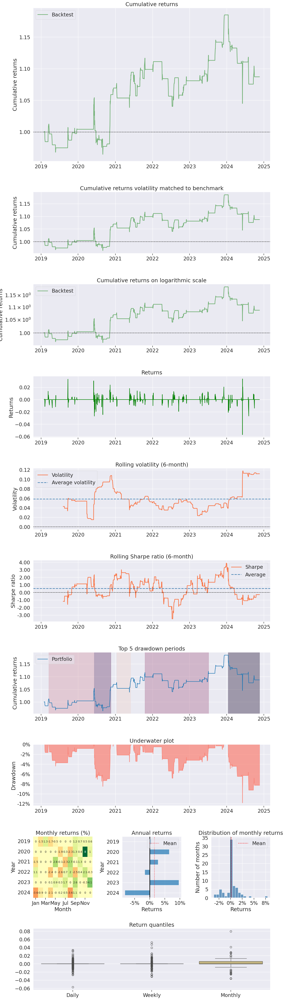

In [29]:
import pandas as pd
import numpy as np
import yfinance as yf
import pyfolio as pf
import matplotlib.pyplot as plt

def calculate_drawdowns(portfolio_values):
    running_max = np.maximum.accumulate(portfolio_values)
    drawdowns = (portfolio_values - running_max) / running_max
    max_drawdown = drawdowns.min()
    return drawdowns, max_drawdown

def run_strategy(initial_cash):
    # Download historical data using yfinance
    ticker = '^NSEI'  # Replace with your preferred ticker
    data = yf.download(ticker, start='2019-01-01', end='2024-12-31')

    # Parameters
    length = 20
    mult = 2.0

    # Bollinger Bands Calculation
    data['basis'] = data['Close'].rolling(window=length).mean()
    data['stddev'] = data['Close'].rolling(window=length).std()
    data['upper_band'] = data['basis'] + (mult * data['stddev'])
    data['lower_band'] = data['basis'] - (mult * data['stddev'])

    # Initialize variables
    trade_in_progress = 0  # 0: No trade, 1: Long, 2: Short
    entry_price = np.nan
    entry_date = None  # Track entry date
    cash = initial_cash  # Track available cash
    stocks_held = 0  # Track stocks held (positive: long, negative: short)
    all_trades = []  # Record all trades
    portfolio_values = []  # Portfolio value after each day
    dates = []  # Dates for portfolio values

    # Simulate the strategy
    for i in range(length, len(data)):
        current_date = data.index[i]
        close_price = data['Close'].iloc[i]
        high_price = data['High'].iloc[i]
        low_price = data['Low'].iloc[i]
        upper_band = data['upper_band'].iloc[i]
        lower_band = data['lower_band'].iloc[i]
        middle_band = data['basis'].iloc[i]

        # Calculate current portfolio value
        portfolio_value = cash + (stocks_held * close_price)
        portfolio_values.append(portfolio_value)
        dates.append(current_date)

        # Handle long position
        if trade_in_progress == 1:  # Long position active
            # Exit after 5 days
            if (current_date - entry_date).days >= 5:  # 5 days passed since entry
                exit_price = close_price  # Exit at current price
                cash += stocks_held * exit_price
                all_trades.append(('Long Exit (5 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Exit after 5 Days at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0

        # COMMENTED OUT: Handle short position
        '''
        elif trade_in_progress == 2:  # Short position active
            # Exit after 5 days
            if (current_date - entry_date).days >= 5:  # 5 days passed since entry
                exit_price = close_price  # Exit at current price
                cash -= abs(stocks_held) * exit_price
                all_trades.append(('Short Exit (5 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Exit after 5 Days at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0
        '''

        # Entry conditions for long position (Upper Bollinger Band)
        if trade_in_progress == 0:
            if high_price >= upper_band:  # Long entry at Upper Band
                entry_price = upper_band
                entry_date = current_date  # Set entry date
                trade_in_progress = 1
                stocks_to_buy = (portfolio_value) / entry_price  # Use 50% of portfolio value
                stocks_held = stocks_to_buy
                cash -= entry_price * stocks_held
                all_trades.append(('Long Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")

            # COMMENTED OUT: Entry conditions for short position (Lower Bollinger Band)
            '''
            elif low_price <= lower_band:  # Short entry at Lower Band
                entry_price = lower_band
                entry_date = current_date  # Set entry date
                trade_in_progress = 2
                stocks_to_short = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                stocks_held = -stocks_to_short  # Negative value indicates a short position
                cash += entry_price * abs(stocks_held)
                all_trades.append(('Short Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")
            '''

    # Create DataFrame for portfolio values
    portfolio_df = pd.DataFrame({'date': dates, 'portfolio_value': portfolio_values})
    portfolio_df.set_index('date', inplace=True)

    # Calculate final cumulative return
    final_value = portfolio_values[-1]
    cumulative_return = ((final_value - initial_cash) / initial_cash) * 100

    # Calculate drawdowns and max drawdown
    drawdowns, max_drawdown = calculate_drawdowns(portfolio_df['portfolio_value'].values)

    # Prepare trade log DataFrame
    trade_log = pd.DataFrame(all_trades, columns=['Type', 'Date', 'Price', 'Quantity', 'Cash', 'Portfolio Value'])

    return portfolio_df, trade_log, final_value, cumulative_return, max_drawdown

def analyze_and_plot(initial_cash):
    portfolio_df, trade_log, final_value, cumulative_return, max_drawdown = run_strategy(initial_cash)

    print(f"\nInitial Cash: ₹{initial_cash:.2f}")
    print(f"Final Portfolio Value: ₹{final_value:.2f}")
    print(f"Final Cumulative Return: {cumulative_return:.2f}%")
    print(f"Max Drawdown: {max_drawdown:.2f}")
    print(f"Number of Trades: {len(trade_log)}")

    # Plot portfolio value over time
    plt.figure(figsize=(12, 6))
    plt.plot(portfolio_df.index, portfolio_df['portfolio_value'])
    plt.title('Portfolio Value Over Time')
    plt.xlabel('Date')
    plt.ylabel('Portfolio Value (₹)')
    plt.grid(True)
    plt.show()

    # Analyze performance using Pyfolio
    portfolio_df['daily_returns'] = portfolio_df['portfolio_value'].pct_change().dropna()
    pf.create_full_tear_sheet(portfolio_df['daily_returns'])

    return portfolio_df, trade_log

# Run the analysis for different initial cash values
initial_cash_values = [2000000, 1000000]

for cash in initial_cash_values:
    analyze_and_plot(cash)


In [ ]:
import pandas as pd
import numpy as np
import yfinance as yf
import pyfolio as pf
import matplotlib.pyplot as plt

def calculate_drawdowns(portfolio_values):
    running_max = np.maximum.accumulate(portfolio_values)
    drawdowns = (portfolio_values - running_max) / running_max
    max_drawdown = drawdowns.min()
    return drawdowns, max_drawdown

def run_strategy(initial_cash):
    # Download historical data using yfinance
    ticker = '^NSEI'  # Replace with your preferred ticker
    data = yf.download(ticker, start='2019-01-01', end='2024-12-31')

    # Parameters
    length = 20
    mult = 2.0

    # Bollinger Bands Calculation
    data['basis'] = data['Close'].rolling(window=length).mean()
    data['stddev'] = data['Close'].rolling(window=length).std()
    data['upper_band'] = data['basis'] + (mult * data['stddev'])
    data['lower_band'] = data['basis'] - (mult * data['stddev'])

    # Initialize variables
    trade_in_progress = 0  # 0: No trade, 1: Long, 2: Short
    entry_price = np.nan
    entry_date = None  # Track entry date
    cash = initial_cash  # Track available cash
    stocks_held = 0  # Track stocks held (positive: long, negative: short)
    all_trades = []  # Record all trades
    portfolio_values = []  # Portfolio value after each day
    dates = []  # Dates for portfolio values

    # Simulate the strategy
    for i in range(length, len(data)):
        current_date = data.index[i]
        close_price = data['Close'].iloc[i]
        high_price = data['High'].iloc[i]
        low_price = data['Low'].iloc[i]
        upper_band = data['upper_band'].iloc[i]
        lower_band = data['lower_band'].iloc[i]
        middle_band = data['basis'].iloc[i]

        # Calculate current portfolio value
        portfolio_value = cash + (stocks_held * close_price)
        portfolio_values.append(portfolio_value)
        dates.append(current_date)

        # Handle long position
        if trade_in_progress == 1:  # Long position active
            # Exit after 5 days
            if (current_date - entry_date).days >= 5:  # 5 days passed since entry
                exit_price = close_price  # Exit at current price
                cash += stocks_held * exit_price
                all_trades.append(('Long Exit (5 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Exit after 5 Days at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0

        # COMMENTED OUT: Handle short position
        '''
        elif trade_in_progress == 2:  # Short position active
            # Exit after 5 days
            if (current_date - entry_date).days >= 5:  # 5 days passed since entry
                exit_price = close_price  # Exit at current price
                cash -= abs(stocks_held) * exit_price
                all_trades.append(('Short Exit (5 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Exit after 5 Days at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0
        '''

        # Entry conditions for long position (Upper Bollinger Band)
        if trade_in_progress == 0:
            if high_price >= upper_band:  # Long entry at Upper Band
                entry_price = upper_band
                entry_date = current_date  # Set entry date
                trade_in_progress = 1
                stocks_to_buy = (portfolio_value) / entry_price  # Use 50% of portfolio value
                stocks_held = stocks_to_buy
                cash -= entry_price * stocks_held
                all_trades.append(('Long Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")

            # COMMENTED OUT: Entry conditions for short position (Lower Bollinger Band)
            '''
            elif low_price <= lower_band:  # Short entry at Lower Band
                entry_price = lower_band
                entry_date = current_date  # Set entry date
                trade_in_progress = 2
                stocks_to_short = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                stocks_held = -stocks_to_short  # Negative value indicates a short position
                cash += entry_price * abs(stocks_held)
                all_trades.append(('Short Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")
            '''

    # Create DataFrame for portfolio values
    portfolio_df = pd.DataFrame({'date': dates, 'portfolio_value': portfolio_values})
    portfolio_df.set_index('date', inplace=True)

    # Calculate final cumulative return
    final_value = portfolio_values[-1]
    cumulative_return = ((final_value - initial_cash) / initial_cash) * 100

    # Calculate drawdowns and max drawdown
    drawdowns, max_drawdown = calculate_drawdowns(portfolio_df['portfolio_value'].values)

    # Prepare trade log DataFrame
    trade_log = pd.DataFrame(all_trades, columns=['Type', 'Date', 'Price', 'Quantity', 'Cash', 'Portfolio Value'])

    return portfolio_df, trade_log, final_value, cumulative_return, max_drawdown

def analyze_and_plot(initial_cash):
    portfolio_df, trade_log, final_value, cumulative_return, max_drawdown = run_strategy(initial_cash)

    print(f"\nInitial Cash: ₹{initial_cash:.2f}")
    print(f"Final Portfolio Value: ₹{final_value:.2f}")
    print(f"Final Cumulative Return: {cumulative_return:.2f}%")
    print(f"Max Drawdown: {max_drawdown:.2f}")
    print(f"Number of Trades: {len(trade_log)}")

    # Plot portfolio value over time
    plt.figure(figsize=(12, 6))
    plt.plot(portfolio_df.index, portfolio_df['portfolio_value'])
    plt.title('Portfolio Value Over Time')
    plt.xlabel('Date')
    plt.ylabel('Portfolio Value (₹)')
    plt.grid(True)
    plt.show()

    # Analyze performance using Pyfolio
    portfolio_df['daily_returns'] = portfolio_df['portfolio_value'].pct_change().dropna()
    pf.create_full_tear_sheet(portfolio_df['daily_returns'])

    return portfolio_df, trade_log

# Run the analysis for different initial cash values
initial_cash_values = [2000000, 1000000]

for cash in initial_cash_values:
    analyze_and_plot(cash)


[*********************100%***********************]  1 of 1 completed


2019-05-07 - Short Entry at 11504.52, Stocks Held: -86.9223
2019-05-13 - Short Exit after 5 Days at 11148.20
2019-05-13 - Short Entry at 11224.17, Stocks Held: -90.4732
2019-05-20 - Short Exit after 5 Days at 11828.25
2019-06-20 - Short Entry at 11635.15, Stocks Held: -84.9288
2019-06-25 - Short Exit after 5 Days at 11796.45
2019-07-08 - Short Entry at 11594.42, Stocks Held: -84.6364
2019-07-15 - Short Exit after 5 Days at 11588.35
2019-07-22 - Short Entry at 11335.21, Stocks Held: -86.5946
2019-07-29 - Short Exit after 5 Days at 11189.20
2019-07-31 - Short Entry at 11007.44, Stocks Held: -89.7473
2019-08-05 - Short Exit after 5 Days at 10862.60
2019-08-05 - Short Entry at 10848.51, Stocks Held: -91.6613
2019-08-13 - Short Exit after 5 Days at 10925.85
2019-08-22 - Short Entry at 10749.33, Stocks Held: -92.1773
2019-08-27 - Short Exit after 5 Days at 11105.35
2019-09-19 - Short Entry at 10692.59, Stocks Held: -91.1319
2019-09-24 - Short Exit after 5 Days at 11588.20
2020-02-03 - Short 

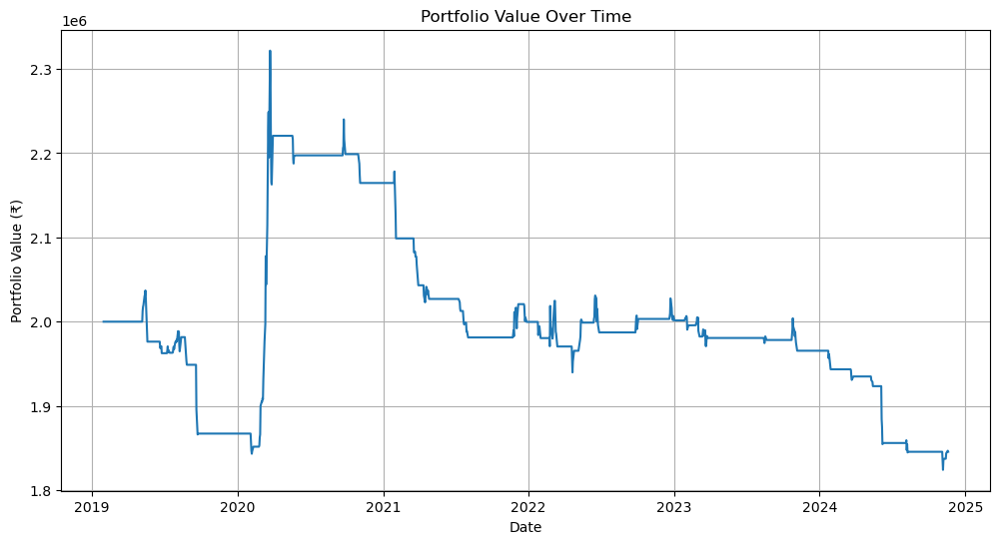

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-1.405%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,-1.405%
Cumulative returns,-7.717%
Annual volatility,5.993%
Sharpe ratio,-0.21
Calmar ratio,-0.07
Stability,0.15
Max drawdown,-21.423%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,21.42,2020-03-23,2024-11-06,NaT,NaN
1,9.51,2019-05-15,2020-02-06,2020-03-12,217
2,2.39,2020-03-19,2020-03-20,2020-03-23,3
3,1.63,2020-03-12,2020-03-13,2020-03-16,3
4,NaN,NaT,NaT,NaT,NaN


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning:

Passed returns do not overlap with anyinteresting times.

[*********************100%***********************]  1 of 1 completed


2019-05-07 - Short Entry at 11504.52, Stocks Held: -43.4612
2019-05-13 - Short Exit after 5 Days at 11148.20
2019-05-13 - Short Entry at 11224.17, Stocks Held: -45.2366
2019-05-20 - Short Exit after 5 Days at 11828.25
2019-06-20 - Short Entry at 11635.15, Stocks Held: -42.4644
2019-06-25 - Short Exit after 5 Days at 11796.45
2019-07-08 - Short Entry at 11594.42, Stocks Held: -42.3182
2019-07-15 - Short Exit after 5 Days at 11588.35
2019-07-22 - Short Entry at 11335.21, Stocks Held: -43.2973
2019-07-29 - Short Exit after 5 Days at 11189.20
2019-07-31 - Short Entry at 11007.44, Stocks Held: -44.8737
2019-08-05 - Short Exit after 5 Days at 10862.60
2019-08-05 - Short Entry at 10848.51, Stocks Held: -45.8307
2019-08-13 - Short Exit after 5 Days at 10925.85
2019-08-22 - Short Entry at 10749.33, Stocks Held: -46.0886
2019-08-27 - Short Exit after 5 Days at 11105.35
2019-09-19 - Short Entry at 10692.59, Stocks Held: -45.5660
2019-09-24 - Short Exit after 5 Days at 11588.20
2020-02-03 - Short 

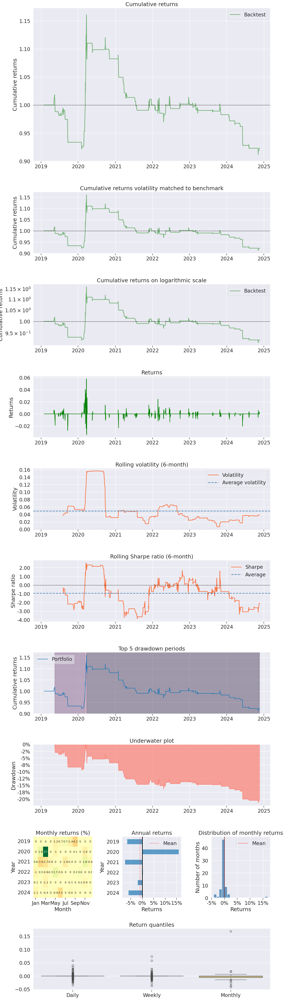

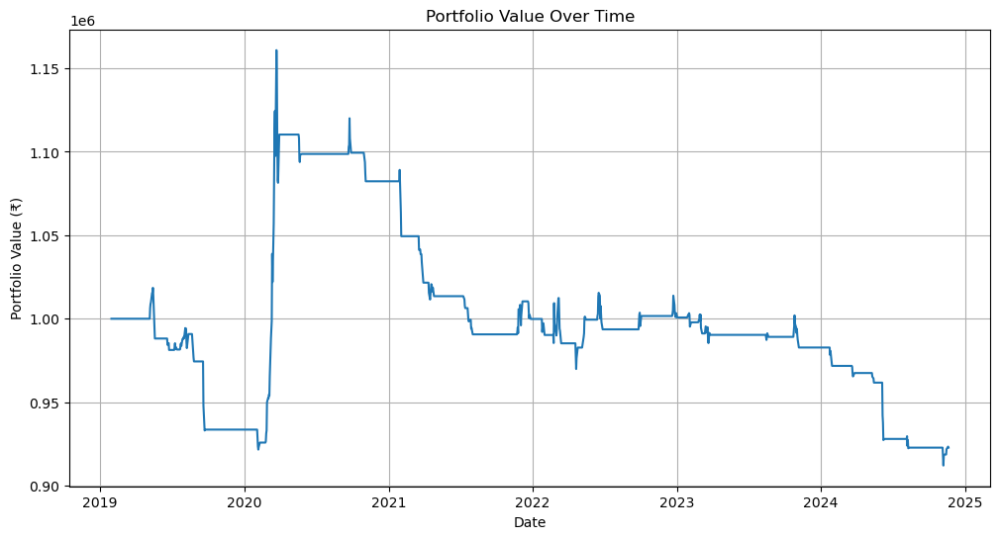

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '-1.405%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,-1.405%
Cumulative returns,-7.717%
Annual volatility,5.993%
Sharpe ratio,-0.21
Calmar ratio,-0.07
Stability,0.15
Max drawdown,-21.423%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,21.42,2020-03-23,2024-11-06,NaT,NaN
1,9.51,2019-05-15,2020-02-06,2020-03-12,217
2,2.39,2020-03-19,2020-03-20,2020-03-23,3
3,1.63,2020-03-12,2020-03-13,2020-03-16,3
4,NaN,NaT,NaT,NaT,NaN


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning:

Passed returns do not overlap with anyinteresting times.



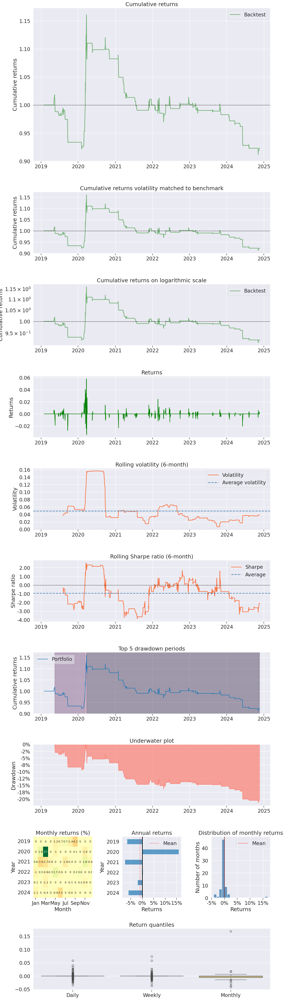

In [30]:
import pandas as pd
import numpy as np
import yfinance as yf
import pyfolio as pf
import matplotlib.pyplot as plt

def calculate_drawdowns(portfolio_values):
    running_max = np.maximum.accumulate(portfolio_values)
    drawdowns = (portfolio_values - running_max) / running_max
    max_drawdown = drawdowns.min()
    return drawdowns, max_drawdown

def run_strategy(initial_cash):
    # Download historical data using yfinance
    ticker = '^NSEI'  # Replace with your preferred ticker
    data = yf.download(ticker, start='2019-01-01', end='2024-12-31')

    # Parameters
    length = 20
    mult = 2.0

    # Bollinger Bands Calculation
    data['basis'] = data['Close'].rolling(window=length).mean()
    data['stddev'] = data['Close'].rolling(window=length).std()
    data['upper_band'] = data['basis'] + (mult * data['stddev'])
    data['lower_band'] = data['basis'] - (mult * data['stddev'])

    # Initialize variables
    trade_in_progress = 0  # 0: No trade, 1: Long, 2: Short
    entry_price = np.nan
    entry_date = None  # Track entry date
    cash = initial_cash  # Track available cash
    stocks_held = 0  # Track stocks held (positive: long, negative: short)
    all_trades = []  # Record all trades
    portfolio_values = []  # Portfolio value after each day
    dates = []  # Dates for portfolio values

    # Simulate the strategy
    for i in range(length, len(data)):
        current_date = data.index[i]
        close_price = data['Close'].iloc[i]
        high_price = data['High'].iloc[i]
        low_price = data['Low'].iloc[i]
        upper_band = data['upper_band'].iloc[i]
        lower_band = data['lower_band'].iloc[i]
        middle_band = data['basis'].iloc[i]

        # Calculate current portfolio value
        portfolio_value = cash + (stocks_held * close_price)
        portfolio_values.append(portfolio_value)
        dates.append(current_date)

        # Handle short position (active)
        if trade_in_progress == 2:  # Short position active
            # Exit after 5 days
            if (current_date - entry_date).days >= 5:  # 5 days passed since entry
                exit_price = close_price  # Exit at current price
                cash -= abs(stocks_held) * exit_price
                all_trades.append(('Short Exit (5 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Exit after 5 Days at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0

        # Entry conditions for short position (Lower Bollinger Band)
        if trade_in_progress == 0:
            if low_price <= lower_band:  # Short entry at Lower Band
                entry_price = lower_band
                entry_date = current_date  # Set entry date
                trade_in_progress = 2
                stocks_to_short = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                stocks_held = -stocks_to_short  # Negative value indicates a short position
                cash += entry_price * abs(stocks_held)
                all_trades.append(('Short Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")

        # COMMENTED OUT: Handle long position
        '''
        elif trade_in_progress == 1:  # Long position active
            # Exit after 5 days
            if (current_date - entry_date).days >= 5:  # 5 days passed since entry
                exit_price = close_price  # Exit at current price
                cash += stocks_held * exit_price
                all_trades.append(('Long Exit (5 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Exit after 5 Days at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0
        '''

        # COMMENTED OUT: Entry conditions for long position (Upper Bollinger Band)
        '''
        if trade_in_progress == 0:
            if high_price >= upper_band:  # Long entry at Upper Band
                entry_price = upper_band
                entry_date = current_date  # Set entry date
                trade_in_progress = 1
                stocks_to_buy = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                stocks_held = stocks_to_buy
                cash -= entry_price * stocks_held
                all_trades.append(('Long Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")
        '''

    # Create DataFrame for portfolio values
    portfolio_df = pd.DataFrame({'date': dates, 'portfolio_value': portfolio_values})
    portfolio_df.set_index('date', inplace=True)

    # Calculate final cumulative return
    final_value = portfolio_values[-1]
    cumulative_return = ((final_value - initial_cash) / initial_cash) * 100

    # Calculate drawdowns and max drawdown
    drawdowns, max_drawdown = calculate_drawdowns(portfolio_df['portfolio_value'].values)

    # Prepare trade log DataFrame
    trade_log = pd.DataFrame(all_trades, columns=['Type', 'Date', 'Price', 'Quantity', 'Cash', 'Portfolio Value'])

    return portfolio_df, trade_log, final_value, cumulative_return, max_drawdown

def analyze_and_plot(initial_cash):
    portfolio_df, trade_log, final_value, cumulative_return, max_drawdown = run_strategy(initial_cash)

    print(f"\nInitial Cash: ₹{initial_cash:.2f}")
    print(f"Final Portfolio Value: ₹{final_value:.2f}")
    print(f"Final Cumulative Return: {cumulative_return:.2f}%")
    print(f"Max Drawdown: {max_drawdown:.2f}")
    print(f"Number of Trades: {len(trade_log)}")

    # Plot portfolio value over time
    plt.figure(figsize=(12, 6))
    plt.plot(portfolio_df.index, portfolio_df['portfolio_value'])
    plt.title('Portfolio Value Over Time')
    plt.xlabel('Date')
    plt.ylabel('Portfolio Value (₹)')
    plt.grid(True)
    plt.show()

    # Analyze performance using Pyfolio
    portfolio_df['daily_returns'] = portfolio_df['portfolio_value'].pct_change().dropna()
    pf.create_full_tear_sheet(portfolio_df['daily_returns'])

    return portfolio_df, trade_log

# Run the analysis for different initial cash values
initial_cash_values = [2000000, 1000000]

for cash in initial_cash_values:
    analyze_and_plot(cash)


[*********************100%***********************]  1 of 1 completed


2019-02-06 - Long Entry at 11059.86, Stocks Held: 90.4170
2019-02-11 - Long Exit after 5 Days at 10888.80
2019-03-11 - Long Entry at 11150.94, Stocks Held: 88.9850
2019-03-18 - Long Exit after 5 Days at 11462.20
2019-03-18 - Long Entry at 11527.06, Stocks Held: 87.2829
2019-03-25 - Long Exit after 5 Days at 11354.25
2019-04-16 - Long Entry at 11799.37, Stocks Held: 84.6294
2019-04-22 - Long Exit after 5 Days at 11594.45
2019-05-07 - Short Entry at 11504.52, Stocks Held: -86.0446
2019-05-13 - Short Exit after 5 Days at 11148.20
2019-05-13 - Short Entry at 11224.17, Stocks Held: -89.5596
2019-05-20 - Short Exit after 5 Days at 11828.25
2019-05-23 - Long Entry at 11986.54, Stocks Held: 81.6067
2019-05-28 - Long Exit after 5 Days at 11928.75
2019-06-20 - Short Entry at 11635.15, Stocks Held: -83.8686
2019-06-25 - Short Exit after 5 Days at 11796.45
2019-07-08 - Short Entry at 11594.42, Stocks Held: -83.5798
2019-07-15 - Short Exit after 5 Days at 11588.35
2019-07-22 - Short Entry at 11335.

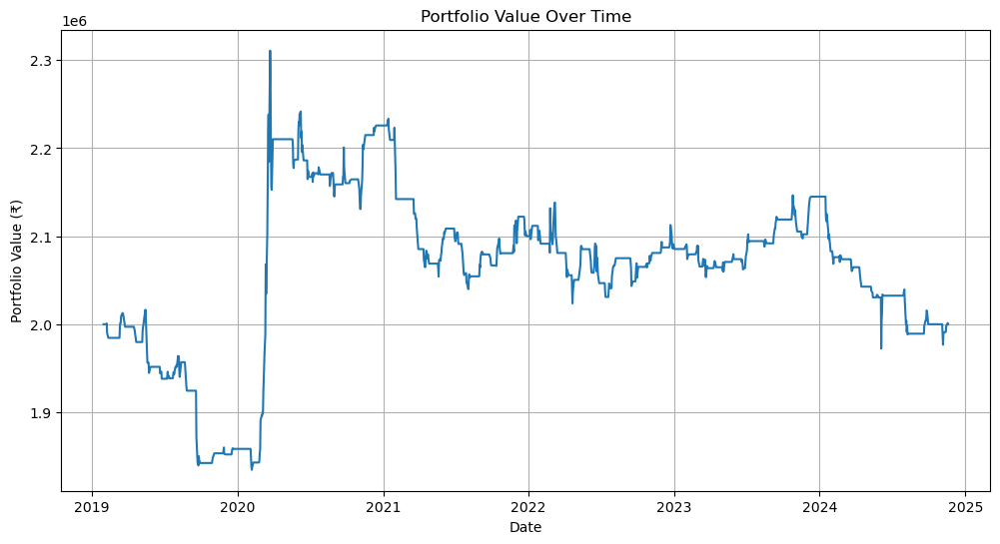

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,0.0%
Cumulative returns,0.001%
Annual volatility,6.644%
Sharpe ratio,0.03
Calmar ratio,0.00
Stability,0.05
Max drawdown,-14.643%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,14.64,2020-03-23,2024-06-04,NaT,NaN
1,9.02,2019-05-15,2020-02-06,2020-03-12,217
2,2.39,2020-03-19,2020-03-20,2020-03-23,3
3,1.63,2019-03-19,2019-04-22,2019-05-15,42
4,1.63,2020-03-12,2020-03-13,2020-03-16,3


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning:

Passed returns do not overlap with anyinteresting times.

[*********************100%***********************]  1 of 1 completed


2019-02-06 - Long Entry at 11059.86, Stocks Held: 45.2085
2019-02-11 - Long Exit after 5 Days at 10888.80
2019-03-11 - Long Entry at 11150.94, Stocks Held: 44.4925
2019-03-18 - Long Exit after 5 Days at 11462.20
2019-03-18 - Long Entry at 11527.06, Stocks Held: 43.6415
2019-03-25 - Long Exit after 5 Days at 11354.25
2019-04-16 - Long Entry at 11799.37, Stocks Held: 42.3147
2019-04-22 - Long Exit after 5 Days at 11594.45
2019-05-07 - Short Entry at 11504.52, Stocks Held: -43.0223
2019-05-13 - Short Exit after 5 Days at 11148.20
2019-05-13 - Short Entry at 11224.17, Stocks Held: -44.7798
2019-05-20 - Short Exit after 5 Days at 11828.25
2019-05-23 - Long Entry at 11986.54, Stocks Held: 40.8033
2019-05-28 - Long Exit after 5 Days at 11928.75
2019-06-20 - Short Entry at 11635.15, Stocks Held: -41.9343
2019-06-25 - Short Exit after 5 Days at 11796.45
2019-07-08 - Short Entry at 11594.42, Stocks Held: -41.7899
2019-07-15 - Short Exit after 5 Days at 11588.35
2019-07-22 - Short Entry at 11335.

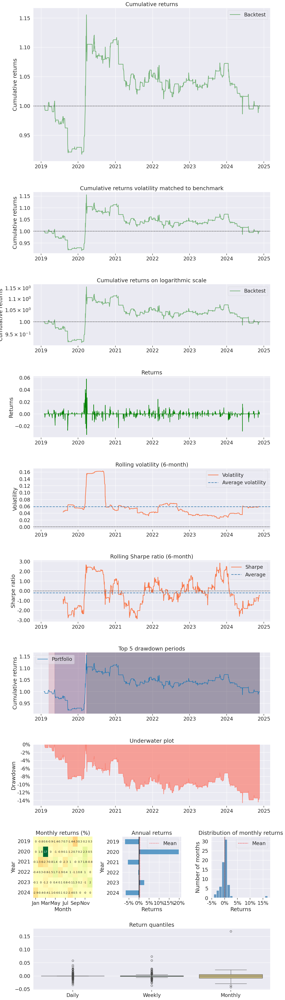

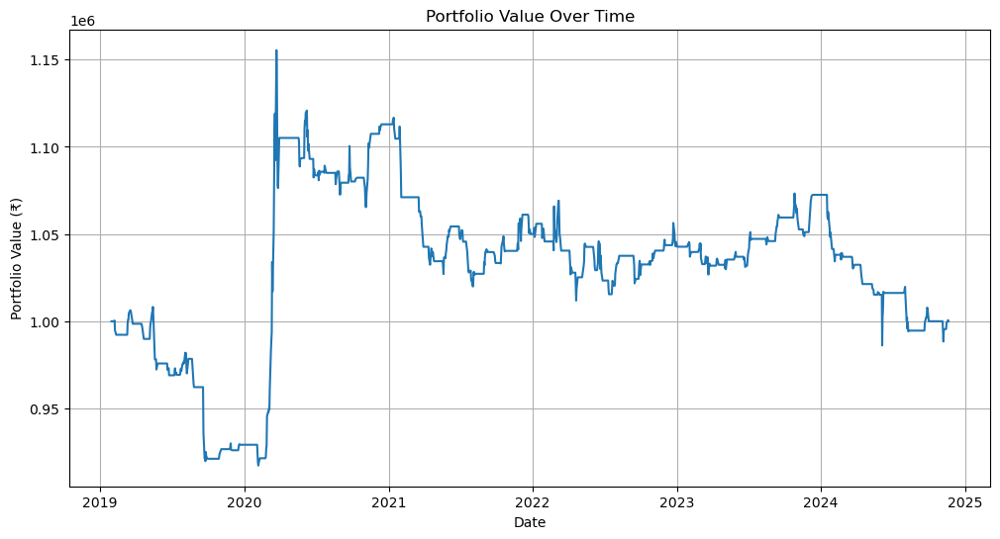

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:670: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.0%' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



Start date,2019-01-30
End date,2024-11-19
Total months,68
,Backtest
Annual return,0.0%
Cumulative returns,0.001%
Annual volatility,6.644%
Sharpe ratio,0.03
Calmar ratio,0.00
Stability,0.05
Max drawdown,-14.643%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,14.64,2020-03-23,2024-06-04,NaT,NaN
1,9.02,2019-05-15,2020-02-06,2020-03-12,217
2,2.39,2020-03-19,2020-03-20,2020-03-23,3
3,1.63,2019-03-19,2019-04-22,2019-05-15,42
4,1.63,2020-03-12,2020-03-13,2020-03-16,3


C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\plotting.py:1407: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

C:\Users\shahc\anaconda3\Lib\site-packages\pyfolio\tears.py:1005: UserWarning:

Passed returns do not overlap with anyinteresting times.



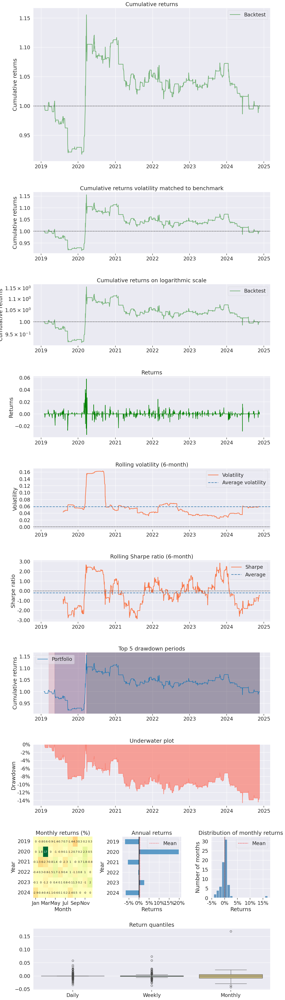

In [31]:
import pandas as pd
import numpy as np
import yfinance as yf
import pyfolio as pf
import matplotlib.pyplot as plt

def calculate_drawdowns(portfolio_values):
    running_max = np.maximum.accumulate(portfolio_values)
    drawdowns = (portfolio_values - running_max) / running_max
    max_drawdown = drawdowns.min()
    return drawdowns, max_drawdown

def run_strategy(initial_cash):
    # Download historical data using yfinance
    ticker = '^NSEI'  # Replace with your preferred ticker
    data = yf.download(ticker, start='2019-01-01', end='2024-12-31')

    # Parameters
    length = 20
    mult = 2.0

    # Bollinger Bands Calculation
    data['basis'] = data['Close'].rolling(window=length).mean()
    data['stddev'] = data['Close'].rolling(window=length).std()
    data['upper_band'] = data['basis'] + (mult * data['stddev'])
    data['lower_band'] = data['basis'] - (mult * data['stddev'])

    # Initialize variables
    trade_in_progress = 0  # 0: No trade, 1: Long, 2: Short
    entry_price = np.nan
    entry_date = None  # Track entry date
    cash = initial_cash  # Track available cash
    stocks_held = 0  # Track stocks held (positive: long, negative: short)
    all_trades = []  # Record all trades
    portfolio_values = []  # Portfolio value after each day
    dates = []  # Dates for portfolio values

    # Simulate the strategy
    for i in range(length, len(data)):
        current_date = data.index[i]
        close_price = data['Close'].iloc[i]
        high_price = data['High'].iloc[i]
        low_price = data['Low'].iloc[i]
        upper_band = data['upper_band'].iloc[i]
        lower_band = data['lower_band'].iloc[i]
        middle_band = data['basis'].iloc[i]

        # Calculate current portfolio value
        portfolio_value = cash + (stocks_held * close_price)
        portfolio_values.append(portfolio_value)
        dates.append(current_date)

        # Handle long position
        if trade_in_progress == 1:  # Long position active
            # Exit after 5 days
            if (current_date - entry_date).days >= 5:  # 5 days passed since entry
                exit_price = close_price  # Exit at current price
                cash += stocks_held * exit_price
                all_trades.append(('Long Exit (5 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Exit after 5 Days at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0

        # Handle short position
        elif trade_in_progress == 2:  # Short position active
            # Exit after 5 days
            if (current_date - entry_date).days >= 5:  # 5 days passed since entry
                exit_price = close_price  # Exit at current price
                cash -= abs(stocks_held) * exit_price
                all_trades.append(('Short Exit (5 Days)', current_date, exit_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Exit after 5 Days at {exit_price:.2f}")
                trade_in_progress = 0
                stocks_held = 0

        # Entry conditions
        if trade_in_progress == 0:
            # Long entry at the upper Bollinger Band
            if high_price >= upper_band:  # Long entry at Upper Band
                entry_price = upper_band
                entry_date = current_date  # Set entry date
                trade_in_progress = 1
                stocks_to_buy = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                stocks_held = stocks_to_buy
                cash -= entry_price * stocks_held
                all_trades.append(('Long Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Long Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")

            # Short entry at the lower Bollinger Band
            elif low_price <= lower_band:  # Short entry at Lower Band
                entry_price = lower_band
                entry_date = current_date  # Set entry date
                trade_in_progress = 2
                stocks_to_short = (portfolio_value * 0.5) / entry_price  # Use 50% of portfolio value
                stocks_held = -stocks_to_short  # Negative value indicates a short position
                cash += entry_price * abs(stocks_held)
                all_trades.append(('Short Entry', current_date, entry_price, stocks_held, cash, portfolio_value))
                print(f"{current_date.date()} - Short Entry at {entry_price:.2f}, Stocks Held: {stocks_held:.4f}")

    # Create DataFrame for portfolio values
    portfolio_df = pd.DataFrame({'date': dates, 'portfolio_value': portfolio_values})
    portfolio_df.set_index('date', inplace=True)

    # Calculate final cumulative return
    final_value = portfolio_values[-1]
    cumulative_return = ((final_value - initial_cash) / initial_cash) * 100

    # Calculate drawdowns and max drawdown
    drawdowns, max_drawdown = calculate_drawdowns(portfolio_df['portfolio_value'].values)

    # Prepare trade log DataFrame
    trade_log = pd.DataFrame(all_trades, columns=['Type', 'Date', 'Price', 'Quantity', 'Cash', 'Portfolio Value'])

    return portfolio_df, trade_log, final_value, cumulative_return, max_drawdown

def analyze_and_plot(initial_cash):
    portfolio_df, trade_log, final_value, cumulative_return, max_drawdown = run_strategy(initial_cash)

    print(f"\nInitial Cash: ₹{initial_cash:.2f}")
    print(f"Final Portfolio Value: ₹{final_value:.2f}")
    print(f"Final Cumulative Return: {cumulative_return:.2f}%")
    print(f"Max Drawdown: {max_drawdown:.2f}")
    print(f"Number of Trades: {len(trade_log)}")

    # Plot portfolio value over time
    plt.figure(figsize=(12, 6))
    plt.plot(portfolio_df.index, portfolio_df['portfolio_value'])
    plt.title('Portfolio Value Over Time')
    plt.xlabel('Date')
    plt.ylabel('Portfolio Value (₹)')
    plt.grid(True)
    plt.show()

    # Analyze performance using Pyfolio
    portfolio_df['daily_returns'] = portfolio_df['portfolio_value'].pct_change().dropna()
    pf.create_full_tear_sheet(portfolio_df['daily_returns'])

    return portfolio_df, trade_log

# Run the analysis for different initial cash values
initial_cash_values = [2000000, 1000000]

for cash in initial_cash_values:
    analyze_and_plot(cash)
